# *Computing final assignment - the infinite unsquare potential* 

Student number - 19107338

In this task I will be using a mixture of numerical methods to solve for the energy eigenvalues and the corresponding wave function solutions for the Schrödinger equation [1] subjected to the infinite square well potential. This is analogous to finding the probable positions and allowed energies for a particle in a box subjected to some potential. The wave function will be evaluated using the fourth-order Runge-Kutta method. The energy eigenvalues will be located using the change of sign and secant methods.

After developing a satisfactory technique for finding solutions, I will then solve for more complicated potentials embedded within the infinite square well.

The potentials covered in this notebook are:

**Part b)** - The infinite square well

**Part c)** - The harmonic potential 

**Part d)** - The finite square well 

**Part e)** - The potential barrier/the double well potential 

**Part f)** - Periodic potential 

**Part g)** - The Morse potential 

*Comment on document length - I experienced an issue with my formatting when it came to evaluating the length of this document. Without graphs loaded in, the document is 34 pages, with the graphs loaded in, it jumps to 91 pages. However, each time a graph function is called, it appears to be producing at least two blank pages for every graph and then displaying the graph image. At most each set of graphs should be half a page. Therefore, as this document contains around 38 graphs it should only consist of 53 pages (this is also most likely an over estimate some of the graphs are more like a fifth of a page or smaller)*

In [1]:
#Import all required modules
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd

#This project will contain lots of figures, warnings about excess figures will be supressed 
import warnings
warnings.filterwarnings('ignore')

---

# Part a) Setting up constants and graph code

First the constants used in this project need to be defined. These are: $m$ - the electron mass, $e$ - the charge of the electron and $\hbar$ the reduced Planck's constant. I will also define half the width of the infinite square well potential - $a$ and divide the full width of the potential into $1000$ $x$points for use in the Runge-Kutta method.

In [2]:
m = 9.109383702e-31 #kg
hbar = 1.054571817e-34 #Js
e = 1.602176634e-19 #C


a = 5e-11 #m 

xstart = -a        # start position, left side of the infinite square well
xend = a          # end position, right side of the infinite square well
N = 1000              # number of points for Runge-Kutta
h = (xend - xstart)/N # size of Runge-Kutta steps

xpoints = np.arange(xstart, xend, h) 

Next I will functionalise most of my graphing code in order to save space later in the notebook. The graphs coded for below are:

boundaryplot - used for identifying roots - plots $\psi(a)$ against $E$ 

fullplot - shows energy values, wave functions and probability density plots for a given potential

compareplot - plot comparing two given analytic and numerical solutions. $kind = 1$ - the function plots the numerical wave function solution in the first plot and the analytic wave function solution in the second plot. $kind = 2$ - the function plots the numerical probability density solution in the first plot and the analytical one in the second plot

solplot - displays a given solution and its probability density

All other plots are only used once but since they contain lots of purely cosmetic code I have included them here to save space.

In [3]:
#Function for creating plots of psi(a) vs E - this will be used for different potentials later
def boundaryplot(potential):
    """Plotting function
       Inputs: potential (Text string to be included in the plots title)
       Outputs: Plot of psi(a) vs E for a range of 0-1000 eV with stepsize 10"""
    psi_a = []
    #Wave function at a for a range of values of E
    for E in np.arange(0,1000,10):
        end = RungeKutta2d(E*e,xpoints)[N]
        psi_a.append(end)
    #plot the wave function at a as a function of E
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    ax.plot(np.arange(0,1000,10),psi_a, c ='b')
    for label in ax.get_yticklabels(): #Sets the axis label colours
        label.set_color("blue")
    for label in ax.get_xticklabels():
        label.set_color("red")
    ax.set_xlim(0)
    ax.set_title(f"Wave function evalutated at boundary $x=a$ vs energy \n for the {potential}")
    ax.set_xlabel("$E (eV)$", fontsize=16, color="red")
    ax.set_ylabel(r"$\psi(a)$ ($m^{\frac{-1}{2}}$)", fontsize=16, color="blue")
    plt.grid(True);
#Plotting function for the energies, wavefunctions and pdf
#of each potential has been turned into a function as it will be used on potentials later on
def fullplot(n,potential,offset,base):
    """Plotting function
       Inputs: n (number of solutions to show), 
               potential (Text string to be included in the plots title)
               offset (used to offset displayed wave functions)
               base (the value of n for the first non-zero wave function solution)
       Outputs: Plot of energy levels, wave function solutions and probability desnity"""
    #plot the wave function at a as a function of E
    fig, ax = plt.subplots(3, 1, figsize=(8, 13))
    #Plot for energy levels
    ax[0].set_xlim(0)
    for i in range(0,n,1):
        ax[0].axhline(y=E_n[i]/e, c= 'r',ls='-',lw=2.5)
        ax[0].text(a, E_n[i]/e, f"$n = {i+base}$", fontsize=8, color="blue")
    for label in ax[0].get_yticklabels():
        label.set_color("red")
    ax[0].plot(xplotpoints,V(xplotpoints)/e,lw=2, color="black")
    ax[0].set_title(f"Numeric energy level solutions \n for the {potential}")
    ax[0].set_xticks([])
    ax[0].set_xlim(-a,a)
    ax[0].set_ylabel("$E_n$ (eV)", fontsize=16, color="red");
    #Plot for wave function
    for i in range(0,n,1):
        #Wave functions are plotted on the same axes with a speration 
        ax[1].plot(xplotpoints,psi_n[i]+(offset*i*10**5),lw=2, color="blue")
        ax[1].text(a+a/10,psi_n[i][N-1]+(offset*i*10**5), f"$n = {i+base} : {E_n[i]/e:1.0f}eV$", fontsize=8, color="blue")
    ax[1].axvline(x=-a,c= '#FF5733',ls='-',lw=2.5) #These two lines are the infinite walls
    ax[1].axvline(x=a,c= '#FF5733',ls='-',lw=2.5)
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_ylabel(r"$\psi_n(x)$ ($m^{\frac{-1}{2}}$)", fontsize=16, color="blue")
    ax[1].set_title(f"Numeric wave function solutions \n for the {potential}");
    #Plot for modulus squared of the wave function
    for i in range(0,n,1):
        ax[2].plot(xplotpoints,psi2_n[i]+(offset*i*10**10),lw=2, color="blue")
        ax[2].text(a+a/10,psi2_n[i][N-1]+(offset*i*10**10), f"$n = {i+base} : {E_n[i]/e:1.0f}eV$", fontsize=8, color="blue")
    ax[2].axvline(x=-a,c= '#FF5733',ls='-',lw=2.5)
    ax[2].axvline(x=a,c= '#FF5733',ls='-',lw=2.5)
    ax[2].set_yticks([])
    ax[2].set_xticks([-a,0, a])
    ax[2].set_xlabel("$x (m)$",fontsize=16)
    ax[2].set_xticklabels([r'$-a$', r'$0$', r'$a$'], fontsize=18);
    ax[2].set_ylabel(r"$|\psi_n(x)|^2$ ($m^{-1}$)", fontsize=16, color="blue")
    ax[2].set_title(f"Numeric probability density solutions \n for the {potential}");
#Comparison plotting function - shows the numerical and analytical solutions
def compareplot(n,kind,potential,base):
    """Solution comparison function
       Inputs: n (solution number to show),
               kind (1 - plots of psi, 2- plots of abs(psi)**2), 
               potential (Text string to be included in the plots title)
       Outputs: Plot analytic and numerical wave function solutions or probability desnity"""
    fig, ax = plt.subplots(2,1,figsize=(9, 6))
    if kind == 1: #Plots the wave functions
        ax[0].plot(xplotpoints,psi_n[n-base],lw=2, color="blue")
        ax[1].plot(xplotpoints,analytic(xplotpoints,n),lw=2, color="blue")
        ax[1].set_xlabel("x", fontsize=14)
        ax[0].set_ylabel((f"$\psi{n}$ numeric" + r"($m^{\frac{-1}{2}}$)"), fontsize=14, color="blue")
        ax[1].set_ylabel((f"$\psi{n}$ analytic"+ r"($m^{\frac{-1}{2}}$)"), fontsize=14, color="blue")
        ax[0].set_title(f'$\psi{n}$ solutions \n for the {potential}', fontsize = 14)
    if kind == 2:#Plots the modulus squared of the wave functions
        ax[0].plot(xplotpoints,psi2_n[n-base],lw=2, color="blue")
        ax[1].plot(xplotpoints,abs(analytic(xplotpoints,n))**2,lw=2, color="blue")
        ax[1].set_xlabel("x", fontsize=14)
        ax[0].set_ylim(0)
        ax[1].set_ylim(0)
        ax[0].set_ylabel((f"$|\psi{n}|^2$ numeric" + r"($m^{-1}$)"), fontsize=14, color="blue")
        ax[1].set_ylabel((f"$|\psi{n}|^2$ analytic" + r"($m^{-1}$)"), fontsize=14, color="blue")
        ax[0].set_title(f'$|\psi{n}|^2$ solutions \n for the {potential}');
#Plots a given solutions        
def solplot(n,potential):
    """Solution comparison function
       Inputs: n (solution number to show), potential (Text string to be included in the plots title)
       Outputs: Plot numerical wave function solutions and probability desnity"""
    fig, ax = plt.subplots(2,1,figsize=(9, 8))
    ax[0].plot(xplotpoints,psi_n[n-1],lw=2, color="blue")
    ax[1].plot(xplotpoints,psi2_n[n-1],lw=2, color="blue")
    ax[0].set_xticks([])
    ax[1].set_xlabel("x", fontsize=14)
    ax[1].set_ylim(0)
    ax[0].set_ylabel((f"$\psi{n}$ numeric" + r"($m^{\frac{-1}{2}}$)"), fontsize=14, color="blue")
    ax[1].set_ylabel((f"$|\psi{n}|^2$ numeric" + r"($m^{-1}$)"), fontsize=14, color="blue")
    ax[0].set_title(f'$\psi{n}$ solutions \n for the {potential}', fontsize = 14)
    ax[1].set_title(f'$|\psi{n}|^2$ solutions \n for the {potential}')
##The next two functions are here so they dont take up space below 
def analyticplot():
    '''This just plots the analytic solutions - only used for the infinite square well'''
    #Wavefunction solutions plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    for i in range(1,7,1):
        ax.plot(xpoints,analytic(xpoints,i)+(5*i*10**5),lw=2, color="blue")
        ax.text(a+a/10,analytic(xpoints,i)[N-1]+(5*i*10**5), f"$n = {i} : {En(i)/e:1.0f}eV$", fontsize=8, color="blue");
    ax.axvline(x=-a,c= '#FF5733',ls='-',lw=2.5)
    ax.axvline(x=a,c= '#FF5733',ls='-',lw=2.5)
    ax.set_yticks([])
    ax.set_xticks([-a,0, a])
    ax.set_xlabel("$x (m)$",fontsize=16)
    ax.set_xticklabels([r'$-a$', r'$0$', r'$a$'], fontsize=18);
    ax.set_ylabel(r"$\psi_n(x)$ ($m^{\frac{-1}{2}}$)", fontsize=16, color="blue")
    ax.set_title("Analytic wave function solutions \n for the infinte square well");
def showmetheground():
    '''This just plots the ground state wavefunction - only used once'''
    #Plotting the wave function and potential well
    fig, ax1 = plt.subplots(2,1,figsize=(8, 6))
    ax1[0].plot(xplotpoints,norm(psi_best),lw=2, color="blue")
    ax1[0].set_ylabel(r"$\psi_1(x)$ ($m^{\frac{-1}{2}}$)", fontsize=16, color="blue")
    ax1[0].set_ylim(0)
    ax1[0].set_yticks([0])
    ax1[0].set_xticks([-a,0,a])
    ax1[0].set_xticklabels([r'$-a$',r'$0$',r'$a$'], fontsize=16);
    ax1[0].set_title('Normalised numerical ground state wavefunction and probability density \n for the infinite square well potential')
    for label in ax1[0].get_yticklabels():
        label.set_color("blue")
    ax1[1].plot(xplotpoints,pdf(norm(psi_best)),lw=2, color="blue")
    ax1[1].set_ylabel(r"$| \psi_1(x) |^2$ ($m^{-1}$)", fontsize=16, color="blue")
    ax1[1].set_xlabel(r"$x$ $(m)$ ", fontsize=16)
    ax1[1].set_ylim(0)
    ax1[1].set_yticks([0])
    ax1[1].set_xticks([-a,0,a])
    ax1[1].set_xticklabels([r'$-a$',r'$0$',r'$a$'], fontsize=16)
    for label in ax1[1].get_yticklabels():
        label.set_color("blue")

---

# Part b) The infinite square well

In this section the solutions for the infinite square well will be evaluated. Initially the ground state energy eigenvalue will be solved for. The corresponding wave function will then be normalised and evaluated. After this I will then develop a technique for finding higher order solutions which will then be quantitatively compared to the analytical results.

## 1. Defining the Schrodinger equation and potential 


The 1D time independent Schrödinger equation[1] is defined as:

$$
-\frac{\hbar^2}{2m} \frac{d^2\psi}{dx^2} + V(x)\psi(x) = E\psi(x)
$$

This can be split up into two simultaneous equations for use with the Runge-Kutta method. With $E$ being the energy of the system, $\psi(x)$ being the wave function evaluated at position $x$, and $\phi$ being the first derivative of the wave function with respect to $x$ and $V(x)$ being the potential:

$$
\frac{d \psi}{dx } = \phi, \\
\frac{d \phi}{dx } = \frac{2m}{\hbar^2} \left[V(x) - E \right] \psi(x),
$$

I will combine the above two equations into a function $f(r,x,E)$, where $r$ is an array containing $\psi$ and $\phi$, $x$ is the array of $x$points we are solving over and $E$ is a set energy value:

In [4]:
def f(r,x,E):
    '''Definition of the Schrödinger equation
    Inputs: r (a vector of the wave function and its first derivative), 
            x (an array of values over which the equation will be solved),
            E (the energy value for which the function will be solved at)
    Outputs: An array of values corresponding to the functions of psi and phi '''
    
    psi = r[0]
    phi = r[1]
    
    fpsi = phi
    fphi = ((2*m)/(hbar**2))*(V(x)-E)*psi
    
    
    return np.array([fpsi,fphi])

The infinite square well potential is defined as:

$$ V_x = \begin{cases} 0 & \text{if } -a \leq x \leq +a, \\ 
\infty  & \text{if } |x| > a, \end{cases} 
$$

As we will only be numerically solving for values inside the potential, the corresponding function for the infinite square well will just return zero for any x input:

In [5]:
def V(x):
    '''Infinite square well potential
    Input: x: x position value
    Output: float = 0 for all x input values'''
    return 0.0*x

## 2. Creating the Runge-Kutta function 

Next the  Runge-Kutta method [2] need to be created. This is defined as:
$$
k_1 = h f(r,x,E), \\
k_2 = h f(r+\frac{1}{2}k_1, x+\frac{1}{2}h, E), \\
k_3 = h f(r+\frac{1}{2}k_2, x+\frac{1}{2}h, E), \\
k_4 = h f(r+k_3, x+h,E), \\
r(x+h) = r(x) + \frac{1}{6}(k_1 + 2k_2 + 2k_3 + k_4).
$$

Where $f(r,x,E)$ will be the function we have created for the 1D time independent Schrödinger and $h$ will be our step size. As we are only interested in $\psi(x)$ the function will return this evaluated at each $x$point.

In the region where the potential is infinite the wave function goes to zero, as the wave function must be continuous [3] at this boundary, the initial value of $\psi$ will be set to $0$. The initial value of $\phi$ will only scale the solutions we obtain so it can be set to any value as we will later normalise the wave functions.

In [6]:
#Code modified from [2] 
#- f now takes E as an input, the outputted array only contains one evaluated function, initital conditions for psi and phi are included in the function

def RungeKutta2d(E,xpoints):
    '''Fourth-order Runge-Kutta rewritten for two simultaneous equations
    Inputs: E: energy eigenvalue
            xpoints: array of x values to be solved over.
    Output: psipoints: solutions for psi(x), numpy array one longer than xpoints'''
    
    r = [0, 1]#Initial values of psi and phi
    
    psipoints = [] #initialise empty array for psi values

    for x in xpoints: # loops over all xpoints up to (xend-h)
        psipoints.append(r[0])
        
        k1 = h*f(r,x,E) 
        k2 = h*f(r+0.5*k1, x+0.5*h,E)
        k3 = h*f(r+0.5*k2, x+0.5*h,E)
        k4 = h*f(r+k3, x+h,E)
        r = r + (k1 + 2*k2 + 2*k3 + k4)/6
    
    # the next line calculates for the point at x = xend
    psipoints.append(r[0])
    
    return np.array(psipoints) #outputs the solutions for psi over the range of xpoints

Experimenting with different initial values of $\phi$ leads to different values for $\psi(a)$: 

$\phi(-a) = 1$ yields $\psi(a) \approx 6.165 \times  10^{-11}$, 

$\phi(-a) = -1$ yields $\psi(a) \approx -6.165 \times  10^{-11}$

$\phi(-a) = 2$ yields $\psi(a) \approx 1.233 \times  10^{-10}$

This means that we could expect some solutions for $\psi(x)$ to differ from the numerical solution by a sign change. As the physical interpretation of a wave function solution is given by its modulus square, this should cause no issues.

## 3. Finding the first Energy value solution

As previously stated $\psi$ must be continuous so we have the boundary condition $\psi(a) = 0$. This will occur for only particular values of $E$, these are the energy eigenvalues for the Schrödinger equation. The analytic eigenvalues for this particular problem are known to be [1]:

$$
E_n = \frac{\pi^2 \hbar^2 n^2}{2m (2a)^2}
$$

In [7]:
def En(n):
    '''Analytical energy eigenvalue function
    Input: n (principle quantum number)
    Output: En (energy eigenvalue for given quantum number)'''
    return ((np.pi**2)*(hbar**2)*(n**2))/(2*m*(2*a)**2)

To find these energy values numerically I will use the secant method [4]. This involves applying the Newton-Raphson method - Where using the derivative of a function,$f(x)$, allows a tangent to be drawn at a guessed position of a root $x$, and its $x$-axis intercept to be calculated:

$$
x' = x - \Delta x = x - \frac{f(x)}{f'(x)}.
$$

But approximating $f'$ to be:

$$
f'(x_2) \approx \frac{f(x_2) - f(x_1)}{x_2 - x_1}
$$

This process can be continued by calculating the function at $x'$, recalculating the tangent, and repeating until a root is found. For this situation we will be looking for a value of $E$ which returns $\psi(a) = 0$, hence the equation becomes:

$$ 
E_3 = E_2 - f(E_2) \frac{E_2 - E_1}{f(E_2) - f(E_1)},
$$

With $f(E)$ being $\psi(a)$ evaluated for the given energy. This process will be repeated with $E_1$ and $E_2$ being updated until the difference between them is less than a given tolerance which will signify a root has been found.

Analytically we know that the first energy eigenvalue is around $37.6 eV$ so  guesses of $E_1 = 0 eV$ and $E_2 = 40 eV$ seem suitable:

In [8]:
#Code modified from [4]
#- initial guesses are now eigenvalues
#Initial guesses for E
E1 = 0*e                    
E2 = 40*e                      
#psi evaluated at a for each guess
sol1 = RungeKutta2d(E1,xpoints)[N]
sol2 = RungeKutta2d(E2,xpoints)[N]

tolerance = e/1000      #tolerance for convergence
#Apply the secant method until the difference between E1 and E2 is within the tolerance
while abs(E2-E1) > tolerance: 
    E3 = E2 - sol2*(E2-E1)/(sol2-sol1)  
    
    E1 = E2 
    E2 = E3 
    
    sol1 = RungeKutta2d(E1,xpoints)[N]
    sol2 = RungeKutta2d(E2,xpoints)[N]
psi_best = RungeKutta2d(E3,xpoints) #Array of values for psi evaluted at the energy eigenvalue
print("The energy which gives psi(a) = 0 is:", E3/e, "eV")
print("The predicted ground state energy value is:", En(1)/e, "eV")
print("The difference between the expected and obtained values is:",abs(E3 - En(1))/e,"eV")

The energy which gives psi(a) = 0 is: 37.603016213536 eV
The predicted ground state energy value is: 37.6030162135296 eV
The difference between the expected and obtained values is: 6.404633874903454e-12 eV


The method has succeeded in finding the first energy eigenvalue which agrees with the analytic value to a high degree of accuracy.

## 4. Normalising:

Now that an energy solution has been found it needs to be normalised over the boundaries of the well. This is because the total probability of finding the particle within the well must be equal to 1 [3.

$$
\int_{-a}^{a} | \psi(x) |^2 {\rm d} x = 1
$$

The below function normalises a given wave function by finding the integral of $| \psi(x) |^2$ and dividing $\psi$ by the square root of this value. The integral between $-a$ and $a$ can be found using [1]:

$$
I(a,-a) = h \left[ \frac{1}{2}f(a) + \frac{1}{2}f(-a) +
      \sum_{k=1}^{n-1}f(x + kh) \right]
$$

In [9]:
def norm(w):
    '''Normalisation function
    Input: w (a value or array of values corresponding to wave function solutions)
    Output: w divided by the square root of the integral of the modulus squared
    of w between the boundaries of the infinite square well'''
    
    f = abs(w)**2 #calculates the modulus squared of w
    intgr = h*(0.5*f[0] + 0.5*f[N] + (sum(f))) #calculates the integral of f over the infinite square well
    
    return w/np.sqrt(intgr)

$| \psi(x) |^2$ is a more physically useful value the the wave function alone as it allows us to see the probability of finding the particle in a given region:

In [10]:
def pdf(f):
    '''Modulus squared
    Input: f (a value or array of values corresponding to wave function solutions)
    Output: the modulus squared of the wave function values'''
    
    return abs(f)**2

## 5. The analytic wave functions

The analytic wave function solutions for the infinite square well are known to be [1] :

$$
\psi_n(x)  = \frac{1}{\sqrt{a}} \cos\left(\frac{ n \pi x}{2a}\right) \qquad 
    n \ \mathrm{odd}
    $$
    $$
    \psi_n(x)  = \frac{1}{\sqrt{a}} \sin\left(\frac{ n \pi x}{2a}\right) \qquad
    n \ \mathrm{even}.
$$

In [11]:
def analytic(x,n):
    '''Analytical wave function solutions
    Inputs:x (x value or array of x values for which solutions will be obtained), 
           n (principle quantum number)
    Output:analytic solution over the xvalues of the wave function for a given n'''
    
    if n % 2 != 0: #If not even return this
        return ((1/np.sqrt(a))*np.cos((n*np.pi*x)/(2*a)))
    else:  #If a value is even return this
        return ((1/np.sqrt(a))*np.sin((n*np.pi*x)/(2*a)))

<IPython.core.display.Javascript object>


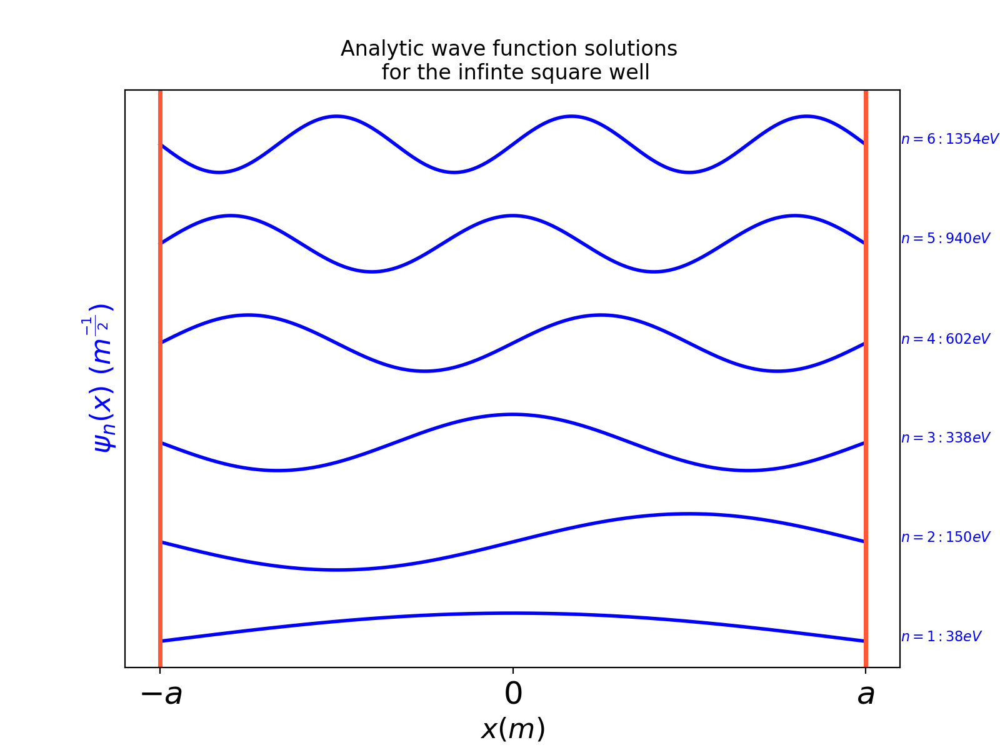

In [12]:
analyticplot()

## 6. Comparing the ground state solutions

We can now plot the normalised wave function and its modulus squared. The units of the wave function will be $m^{\frac{-1}{2}}$ and the units of the modulus squared will be $m^{-1}$ as $| \psi(x) |^2 {\rm d} x $ gives a probability - which is dimensionless. I haven't included any values on the y axis for each plot as the general shape of each graph and it's maxima and minima are more physically useful than the actual value of the wave function (The plot functions solplot and compareplot however do contain values on the y axis):

<IPython.core.display.Javascript object>


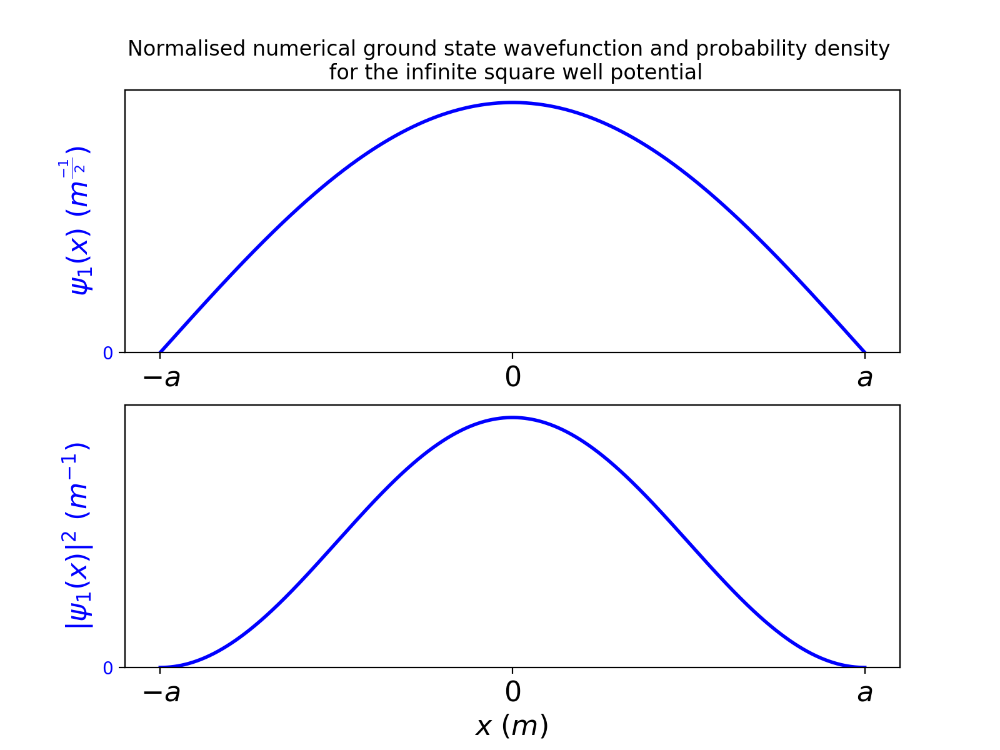

In [13]:
xplotpoints = np.arange(xstart, xend+h, h) # array with same properties as xpoints but includes end point
showmetheground()

The ground state solution has taken on the shape we would expect it to. The particle is most likely to be found in the region around the center of the box which corresponds to the higher probability density. At the boundaries the wave function becomes zero as the potential jumps to infinity. In order to evaluate the match between the analytical and numerical ground state, I will calculate the sum of the squares of the residuals between the numerical and analytic solution. A low value will indicate that the two solutions give very similar answers:

In [14]:
sum_squares = np.sum(norm(psi_best) - analytic(xplotpoints,1))**2
print(f"The sum of the residuals squared is = {sum_squares}")

The sum of the residuals squared is = 9.86632959260875e-10


It can be seen that both solutions have a very small sum of residuals squared and hence the numerical solution closely matches the analytical one.

## 6. Method for finding higher energy values

Having determined the first energy eigenvalue and its corresponding solutions we can now move on to determining higher energy states for the infinite square well. In order to do this I have devised a method combining both the secant method and the change of sign method for root finding.

If $\psi(a)$ is plotted vs E then the roots of this plot will correspond to the eigenvalue solutions:

<IPython.core.display.Javascript object>


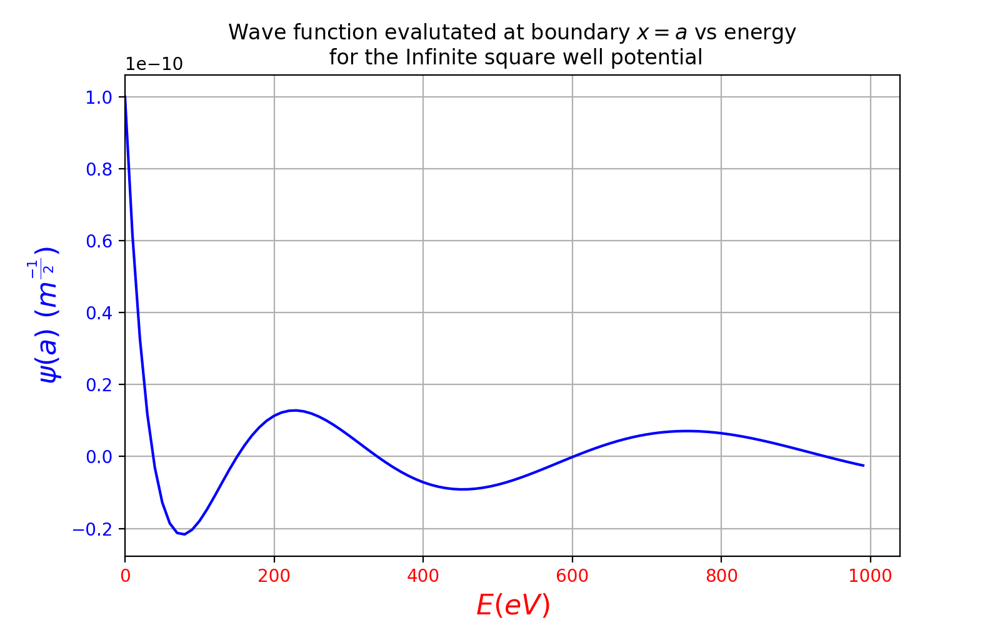

In [15]:
#Use the boundary potential function to plot for the infinte square well
boundaryplot("Infinite square well potential")

Over a root, the sign of $\psi(a)$ will change for $E_i$ and $E_{i+1}$ [5]. These pairs can then be used as initial guesses for the secant method in order to find the correct energy eigenvalue.

The below function executes this method. Initially it calculates $\psi(a)$ for a given energy range. If a sign change is found in these solutions then the secant method is applied to find the root. Once a root has been found the corresponding solutions for $E_n$, $\psi_n$ and $|\psi_n|^2$ are saved. Once all roots have been found, the function returns an array of the solutions.

Observing the plot we can see that the first root is roughly around $37 eV$ and the second root is around $150 eV$. We can now attempt to find the two values for each root between which the root lies. I've chosen to use an array of energy values separated $80 eV$ apart as any higher separation causes issues with the secant method and any lower is a waste of computational time.


In [16]:
#Eigensolution finding function
def findzeros(start,end,step):
    """Solution finder
       Inputs: start, end and step size of energy values (in eV) for which solutions will be found over
       Outputs: E_n, psi_n and psi2_n - energy eigenvalues, wave function solutions and probability density solutions """
    energies = np.arange(start*e,end*e,step*e)
    #Array for storing the value of the wave function at a
    psi_a = []
    #Solve for the wavefunction at the boundary for each energy in range
    for E in energies:
        psi_a.append(RungeKutta2d(E,xpoints)[N])
    #Energy,Wavefuncion and probability density solutions
    psi_n = []
    psi2_n = []
    E_n = np.array([])
    #Set tolerance
    tolerance = e/1000
    for i in range(0,len(psi_a)-1,1):
        #Initial energy guesses are neighbouring indexs in our range of energies
        E1 = energies[i]          
        E2 = energies[i+1]
        #Initial solutions are neighbouring indexs in boundary solutions
        sol1 = psi_a[i]
        sol2 = psi_a[i+1]
        #If a sign change occurrs between solutions at the boundary search for the root 
        if np.sign(psi_a[i]) + np.sign(psi_a[i+1]) == 0:
            #Find the location of the root within the tolerance using secant method
            while abs(E2-E1) > tolerance: 
                E3 = E2 - sol2*(E2-E1)/(sol2-sol1)  
                #Update energy guesses and evaluate wavefunction
                E1 = E2 
                E2 = E3 
                sol1 = RungeKutta2d(E1,xpoints)[N]
                sol2 = RungeKutta2d(E2,xpoints)[N]
            #Add the solutions to the arrays
            E_n = np.append(E_n, E3)
            psi_n.append(norm(RungeKutta2d(E3,xpoints)))#Normilisation of wave function solutions has been included
            psi2_n.append(pdf(norm(RungeKutta2d(E3,xpoints))))
            
    return E_n, psi_n, psi2_n

To quickly note on issues that may arise from this method - In general it will be seen that this method of solution finding is very useful - however, I expect problems to arise for potentials which produce a boundary plot with roots very close together as some of these could potentially be skipped over if the step size is too large. The inverse of this issue could be the root search identifying multiple roots when in fact there is only one present. The first issue can be solved by decreasing the step size in the findzeros() function until the roots are identified. The second can be solved by increasing the step size so the function skips over this identical root. There is still a possibility that with some complex potentials roots are missed.

In [17]:
#Start and end times used to evaluate the speed of the process
start = time.time()
E_n, psi_n, psi2_n = findzeros(0,50000,80)
end = time.time()
print(f" {len(E_n)} solutions found \n Runtime of search was {end - start} seconds")

 36 solutions found 
 Runtime of search was 18.831953048706055 seconds


## 7. Plotting the first few numerical solutions

<IPython.core.display.Javascript object>


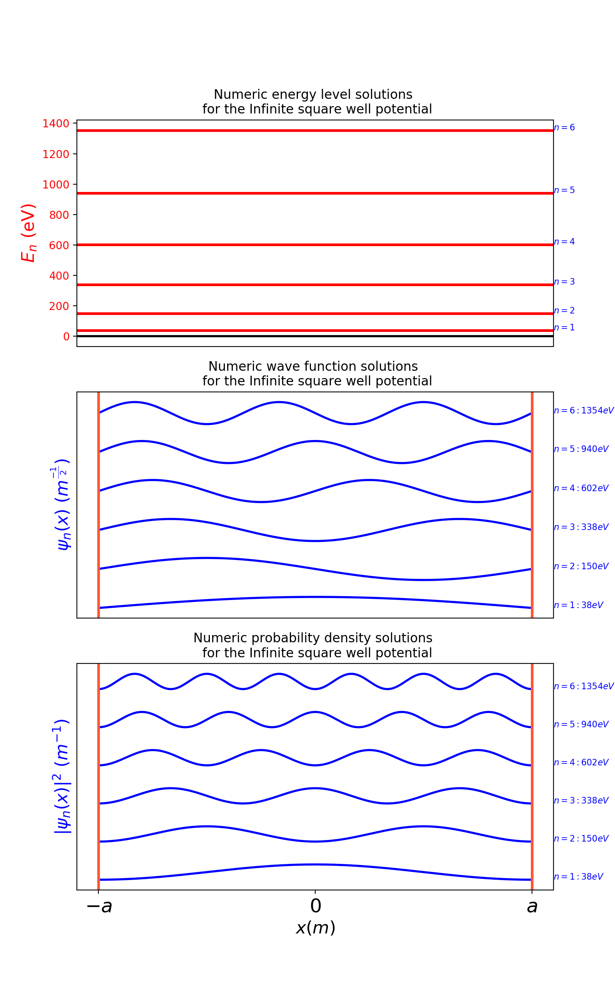

In [18]:
fullplot(6,"Infinite square well potential",5,1)

It can be seen that the solutions qualitatively match the analytic solutions however some differ by a sign change, this is due to the initial value of $\phi$ used in the Runge-Kutta method. As previously mentioned, this is merely a cosmetic difference and doesn't change the physical meaning of the wave function which can be obtained from the plots modulus squared - which do match.

As mentioned above we can see that although the wave functions for $n=2$ differ by a sign change, the probability density functions are equivalent. Comparing higher values of $n$ such as $n=20$ or $n=25$, we can see that the analytic and numerical solutions are in good agreement:

<IPython.core.display.Javascript object>


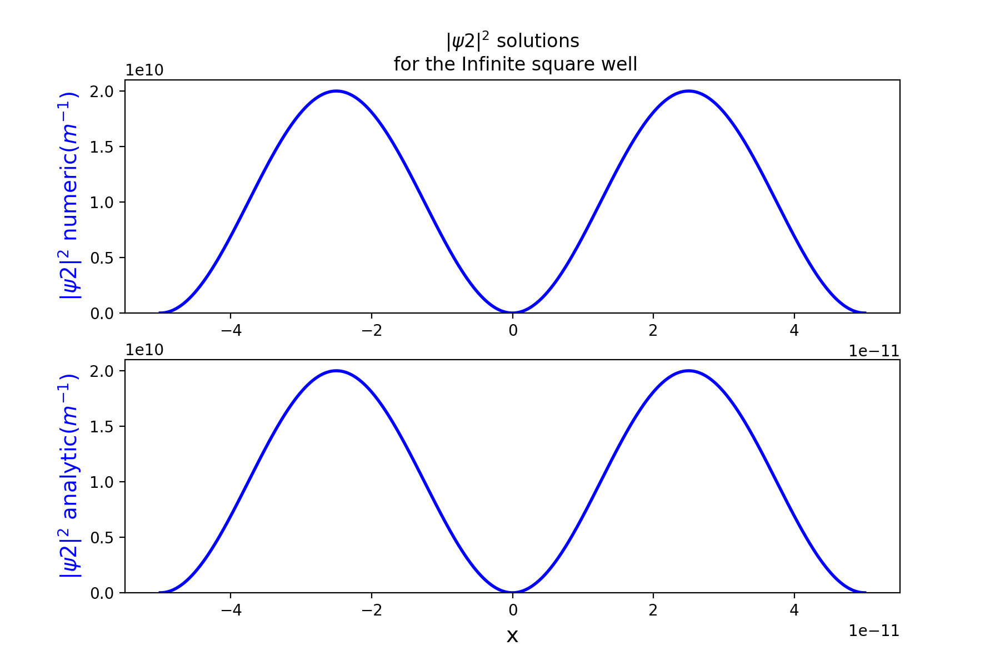

<IPython.core.display.Javascript object>


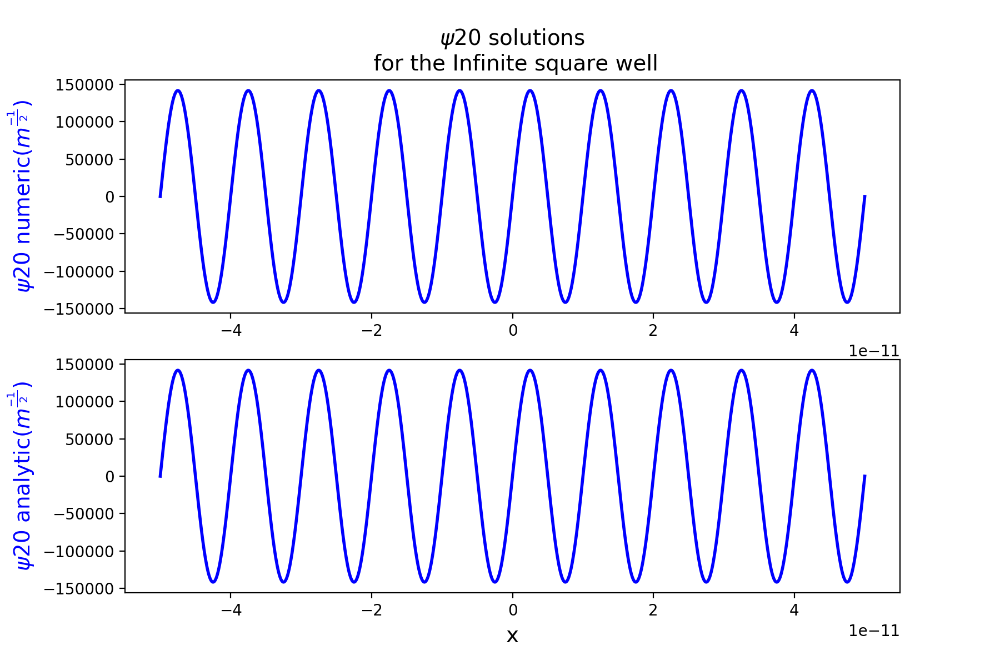

<IPython.core.display.Javascript object>


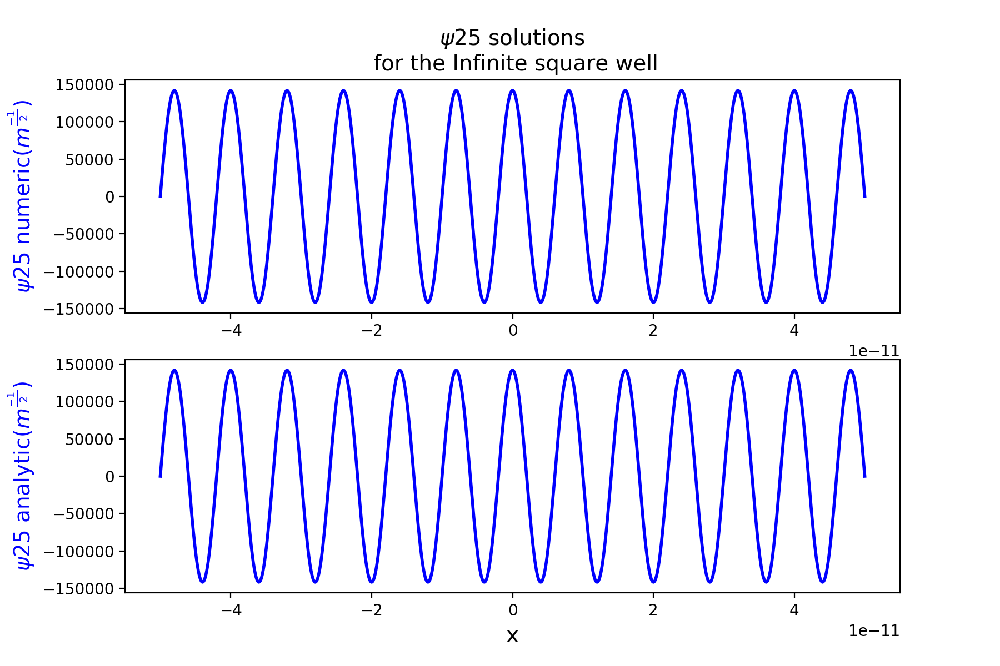

In [19]:
compareplot(2,2,"Infinite square well",1)
compareplot(20,1,"Infinite square well",1)
compareplot(25,1,"Infinite square well",1)

## 8. Quantitative comparison of analytical and numeric solutions

The numerical energy value solutions and wave functions look like they match the analytical ones but in order to full evaluate the match the differences need to be calculated.

Below the percentage error $\frac{|E_{numeric} - E_{analytic}|}{E_{analytic}} \times 100$  has been calculated and plotted so comparisons can be made. A pandas data-frame has also been created containing the values of each solution, the difference between them and the percentage error:

<IPython.core.display.Javascript object>


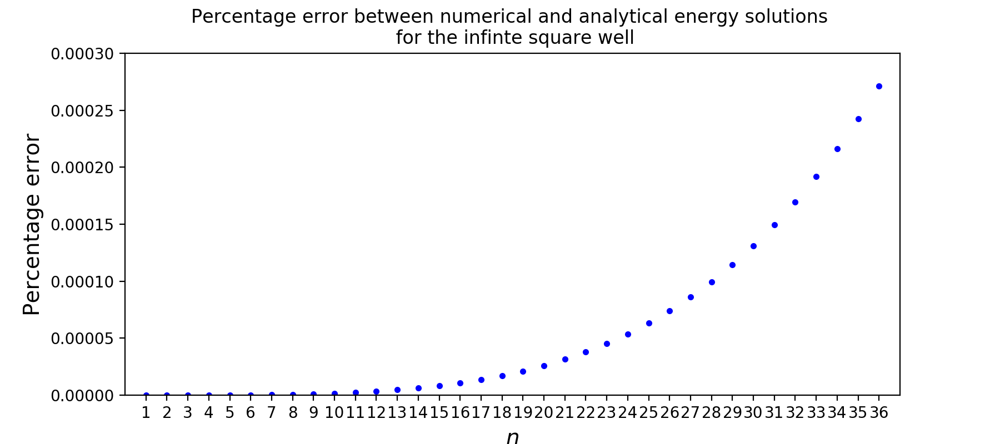

In [20]:
#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {'n':[], 'Found Solutions (eV)':[],'Known Solutions (eV)':[], 'Difference (eV)':[], 'Percentage Error': [] }
df = pd.DataFrame(d)
for i in range(0,len(E_n),1):
    df = df.append({'n': i+1, 'Found Solutions (eV)': E_n[i]/e, 'Known Solutions (eV)': En(i+1)/e, 'Difference (eV)': abs(E_n[i] - En(i+1))/e,'Percentage Error': ((abs(E_n[i] - En(i+1)))/En(i+1))*100}, ignore_index=True)

fig, ax = plt.subplots(1, 1, figsize=(9, 4))

ax.set_ylim(0,0.0003)
ax.set_xlim(0,37)
ax.set_title(f"Percentage error between numerical and analytical energy solutions \n for the infinte square well")
ax.set_xlabel("$n$", fontsize=14)
ax.set_ylabel("Percentage error", fontsize=14)
ax.set_xticks(np.arange(1,37))
ax.plot(df['n'],df['Percentage Error'], c='b', linestyle = 'none', marker ='.');

#df.head(10) #Show the data frame, df.head(n)-will show the first n rows

It can clearly be seen that as n increases the deviation between the analytical and numeric solutions exponentially increase using this method of root finding. However, it can also be seen that these differences remain small even at values of $n > 30 $ and hence the method is still useful.

Next the wave functions have been compared. I have calculated the sum of the squares of the residuals between the absolute values for each solution up to $n=36$ and plotted them against the value of $n$. I have used the absolute value due to the sign change phenomena mentioned above:

<IPython.core.display.Javascript object>


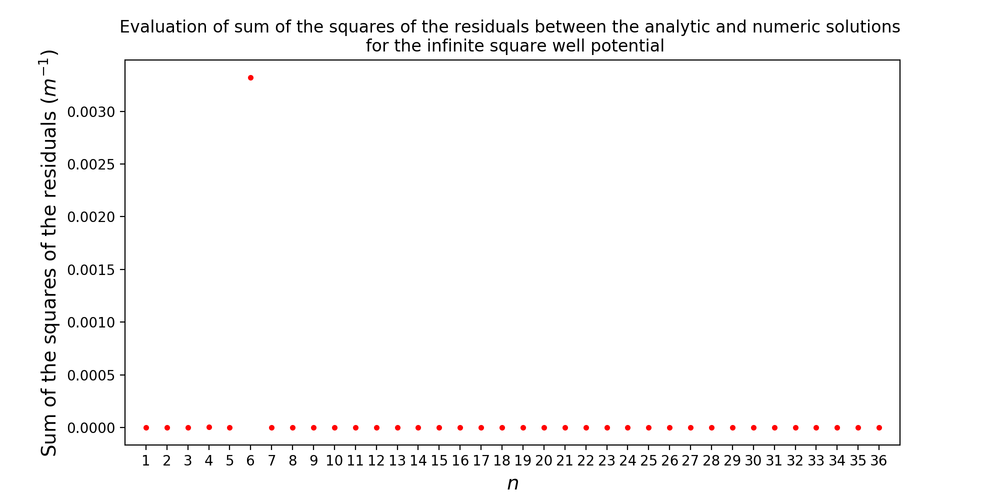

In [21]:
#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {}
df = pd.DataFrame(d)
for i in range(1,len(E_n)+1,1):
    df = df.append({'n': i, 'Sum of the squares': np.sum(abs(psi_n[i-1]) - abs(analytic(xplotpoints,i)))**2}, ignore_index=True)


fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(df['n'],df['Sum of the squares'],c='r', linestyle = 'none', marker = '.')
ax.set_ylabel(r"Sum of the squares of the residuals $(m^{-1})$ ", fontsize=14)
ax.set_xlim(0,37)
ax.set_xticks(np.arange(1,37))
ax.set_xlabel("$n$", fontsize=14)
ax.set_title('Evaluation of sum of the squares of the residuals between the analytic and numeric solutions \n for the infinite square well potential');

#df.head(10) 

## 9. Discussion of results

It can be seen that for all solutions the sum of the squares of the residuals is very low, there is an unusual spike at $n=6$ however this value is still small in comparison to the size of the wave functions. I therefore conclude that the method for finding and calculating wave function solutions is suitable. It can now be used for solving the Schrödinger equation for more complicated potentials. 

For the infinite square well it can be seen that the nth solution has $n$ peaks in the plot of the probability density function. As $n$ (and therefore the energy) increases the probability of finding the particle over any region of the well becomes more even. Classically any energy values is permitted whereas in this quantum model only certain, quantized, values are allowed. However, for large values of $n$ the difference produced by quantization would become unnoticeable when compared to the total energy of the system. Classic theory also predicts that the distribution of the particle over the well is even, we can see that the quantum theory produces the same results as $n$ increases. This is an example of the correspondence principle [3] in which quantum results agree with classical results for large quantum numbers.

----

# Part c) Harmonic potential

In this section I will used the methods developed in part b to solve for the solutions of the harmonic potential. I will compare these with the analytical solutions and discuss the similarities and differences.

## 1. The harmonic potential and the analytic solutions

The harmonic potential takes the form:

$$
V(x) = V_0 \frac{x^2}{a^2}
$$

Where $V_0$ is some baseline potential:

In [22]:
def V(x):
    """The harmonic potential
       Input: x: x position value
       Output: The harmonic potential evalauted for the x input value"""
    return V0*(x**2)/(a**2)

The analytical energy eigenvalue solutions for a pure quantum harmonic oscillator of the form [3]:

$$
V(x) = \frac{1}{2}Kx^2
$$

are given by:

$$
E_n = (n+ \frac{1}{2})\hbar\omega_{c}
$$

Where $\omega_{c}$ is the angular frequency of the particles harmonic oscillations given by:

$$
\omega_c = \sqrt{\frac{K}{m}}
$$

Setting our potential equal to this potential we can rearrange for $K$ and $\omega_c$ and hence obtain an analytical equation for the energy eigenvalues:

$$
K = \frac{2V_0}{a^2}, \omega_c = \sqrt{\frac{2V_0}{a^2m}}
$$

The analytic wave function solutions are given by ([3] and [6]):

$$
\psi_n (y) = (\frac{\alpha}{\pi})^{\frac{1}{4}}\frac{1}{\sqrt{2^nn!}}H_ne^{\frac{-y^2}{2}}
$$

Where $$\alpha = \frac{m\omega_c}{\hbar}, y = \sqrt{\alpha}x$$ and $H_n$ are the Hermite polynomials.

The analytic energy and wave function solutions have been calculated below. The wave function solutions have been normalised over the region of the infinite square well. The reason for this will be discussed below. This potential has a none-zero solution for $n=0$ called the zero point energy. This is the lowest possible energy this system can occupy. To account for this the labeling of the plots have been slightly altered.

In [23]:
def En(n):
    '''Analytical energy eigenvalue function for the harmonic potential
    Input: n (principle quantum number)
    Output: En (energy eigenvalue for given quantum number)'''
    return (n+0.5)*hbar*np.sqrt((2*V0)/(m*a**2))

#Import the Hermite polynomials from the scipy library - [7]
from scipy.special import eval_hermite as H

def analytic(x,n):
    '''Analytical wave function solutions for the harmonic potential 
    Inputs:x (x value or array of x values for which solutions will be obtained), 
           n (principle quantum number)
    Output:normalised analytic solution over the xvalues of the wave function for a given n'''
    omega = np.sqrt((2*V0)/(m*a**2))
    alpha = (m*omega)/hbar
    y = np.sqrt(alpha)*x
    
    return norm(((alpha/np.pi)**(-1/4))*(1/np.sqrt(np.math.factorial(n)*(2**n)))*H(n,y)*np.exp((-y**2)/2))

## 2. Numerical solutions for $V_0 = 700 eV$

Once again we can take a look at the plot of $\psi(a)$ against $E$ in order to get a general idea of where the first few energy eigenvalues lie:

<IPython.core.display.Javascript object>


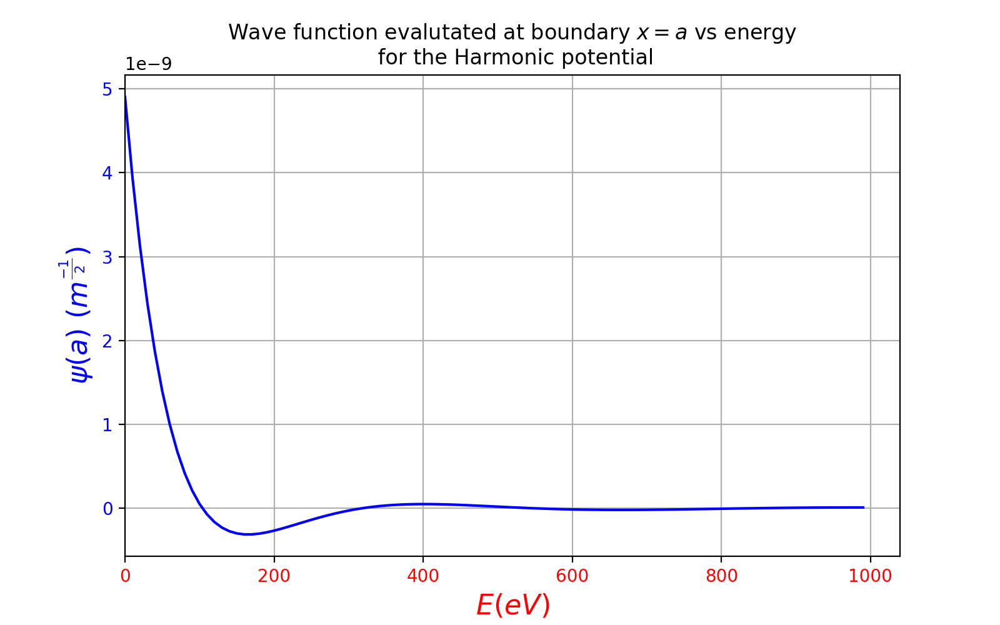

In [24]:
V0 = 700*e
boundaryplot("Harmonic potential")

The first solution looks to be around $101eV$ and the second around $318eV$. Using the solution finding function we can look for the first few solutions in the range of $0-2000eV$ with a step size of $100eV$ and then plot them out:

 6 solutions found 
 Runtime of search was 2.2240071296691895 seconds


<IPython.core.display.Javascript object>


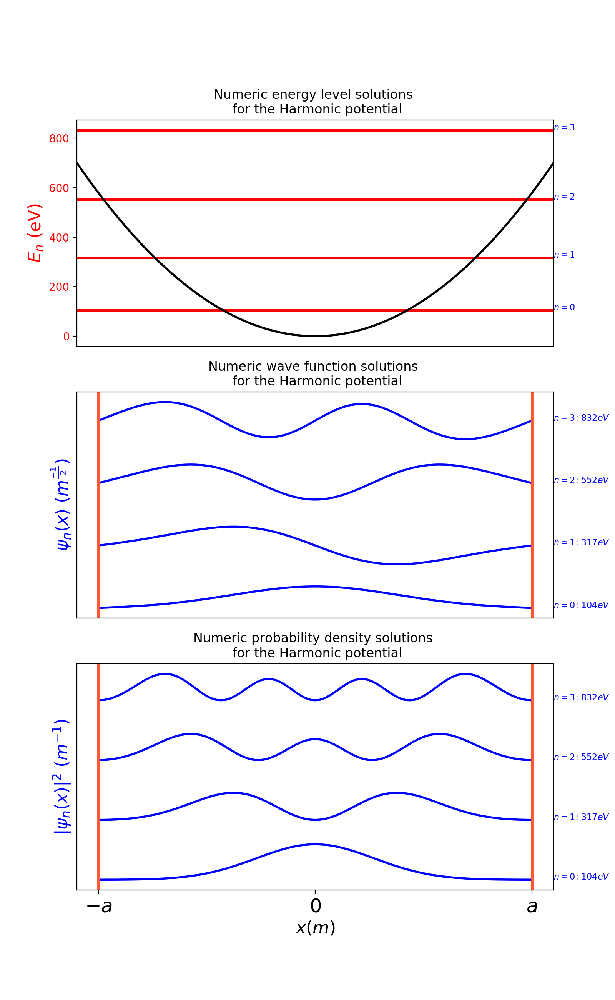

In [25]:
start = time.time()
E_n, psi_n, psi2_n = findzeros(0,2000,100)
end = time.time()
print(f" {len(E_n)} solutions found \n Runtime of search was {end - start} seconds")
fullplot(4,"Harmonic potential",5,0)

<IPython.core.display.Javascript object>


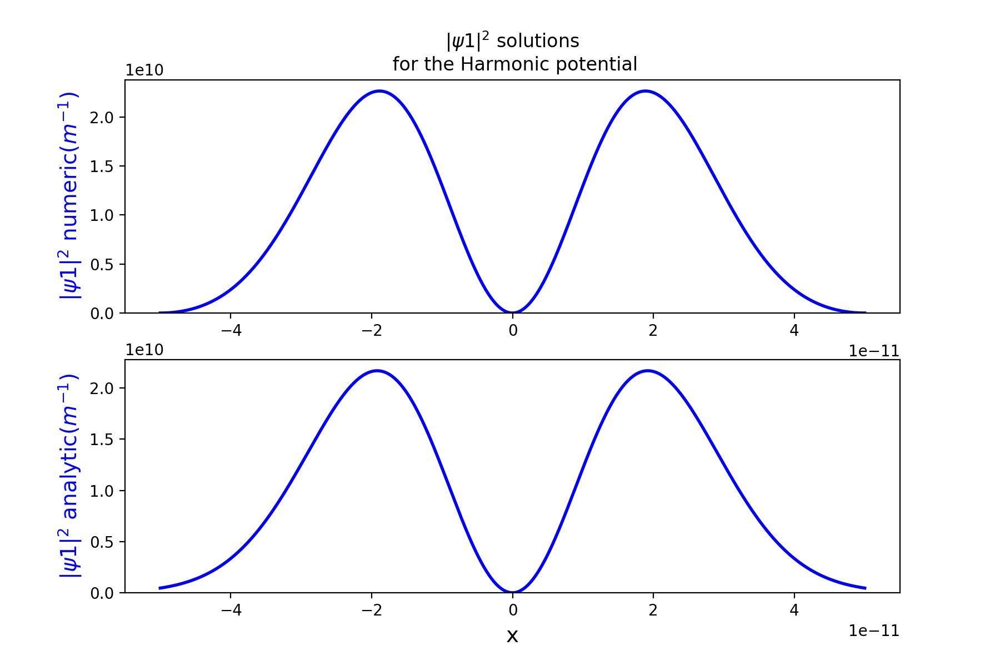

<IPython.core.display.Javascript object>


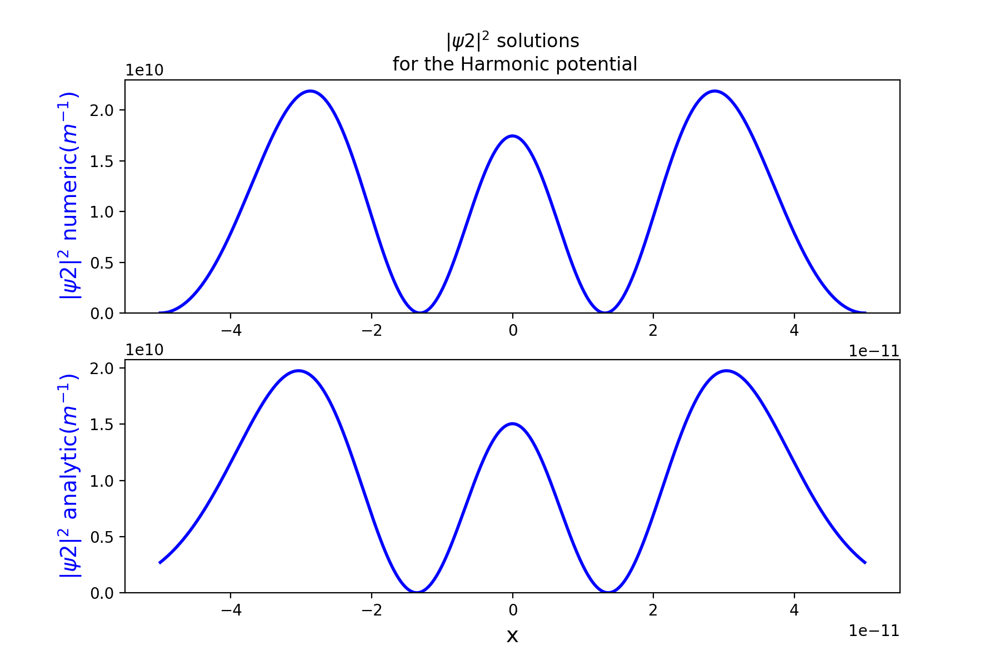

<IPython.core.display.Javascript object>


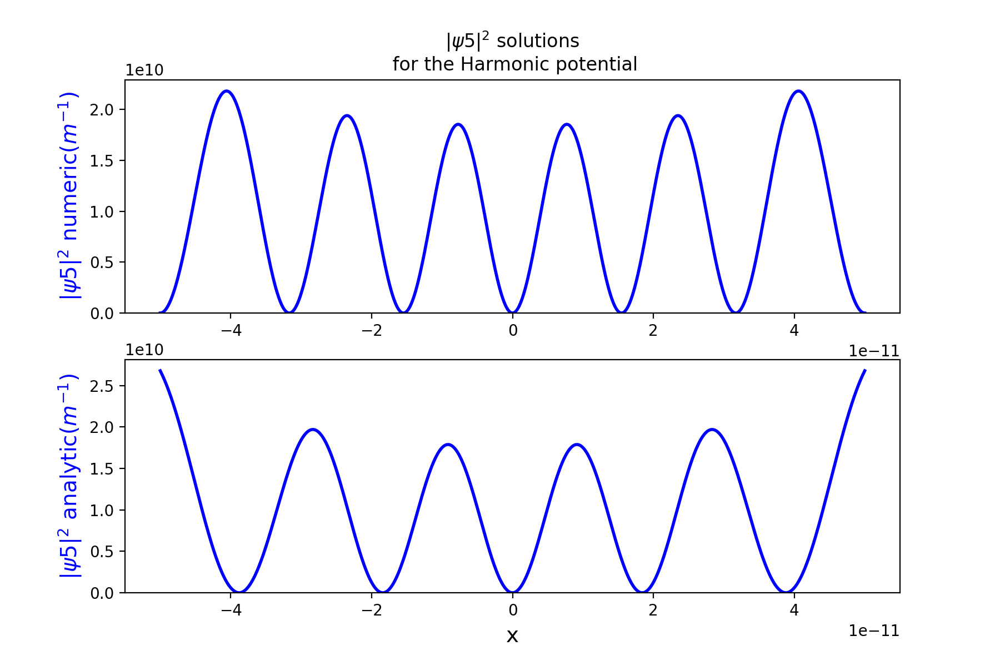

In [26]:
compareplot(1,2,"Harmonic potential",0)
compareplot(2,2,"Harmonic potential",0)
compareplot(5,2,"Harmonic potential",0)

## 3. Quantitative comparison of analytical and numeric solutions

Once again we can compare the sets of solutions using the same techniques as for the infinite square well: 

<IPython.core.display.Javascript object>


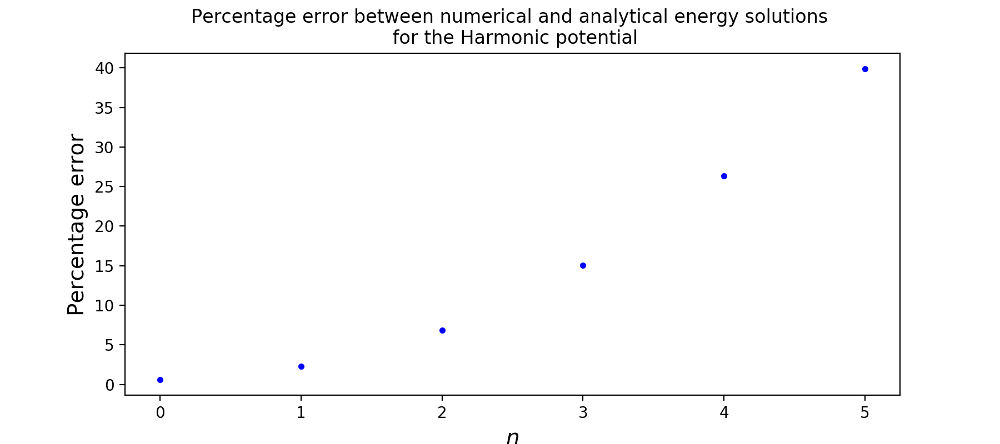

<IPython.core.display.Javascript object>


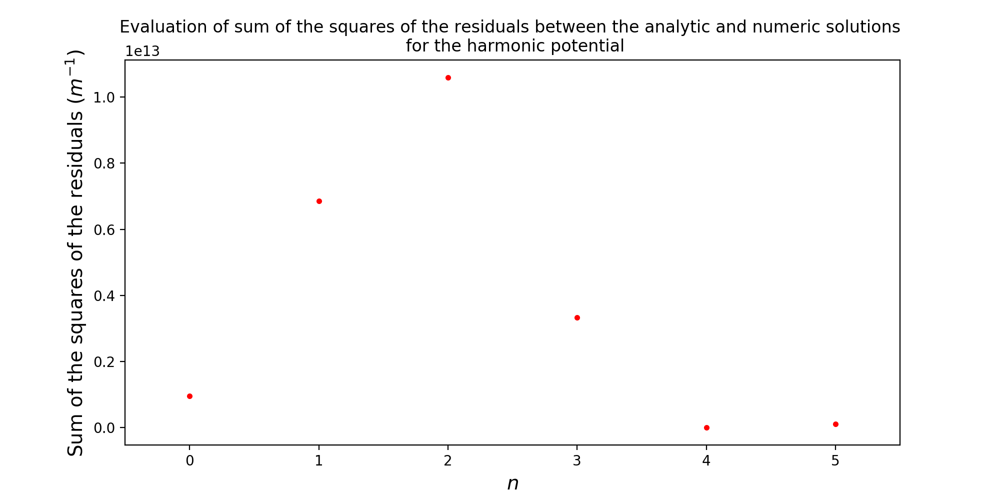

In [27]:
#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {'n':[], 'Found Solutions (eV)':[],'Known Solutions (eV)':[], 'Difference (eV)':[], 'Percentage Error': [] }
df = pd.DataFrame(d)
for i in range(0,len(E_n),1):
    df = df.append({'n': i, 'Found Solutions (eV)': E_n[i]/e, 'Known Solutions (eV)': En(i)/e, 'Difference (eV)': abs(E_n[i] - En(i))/e,'Percentage Error': ((abs(E_n[i] - En(i)))/En(i))*100}, ignore_index=True)
fig, ax = plt.subplots(1, 1, figsize=(9, 4))
ax.set_title(f"Percentage error between numerical and analytical energy solutions \n for the Harmonic potential")
ax.set_xlabel("$n$", fontsize=14)
ax.set_ylabel("Percentage error", fontsize=14)
ax.plot(df['n'],df['Percentage Error'], c='b', linestyle = 'none', marker = '.');
#print(df.head(5)) #Show the data frame, df.head(n)-will show the first n solutions
#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {}
df = pd.DataFrame(d)
for i in range(0,len(E_n),1):
    df = df.append({'n': i, 'Sum of the squares': np.sum(abs(analytic(xplotpoints,i)) - abs(psi_n[i]))**2}, ignore_index=True)
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(df['n'],df['Sum of the squares'],c='r', linestyle = 'none', marker = '.')
ax.set_ylabel(r"Sum of the squares of the residuals $(m^{-1})$ ", fontsize=14)
ax.set_xlim(-0.5,5.5)
ax.set_xticks(np.arange(0,6))
ax.set_xlabel("$n$", fontsize=14)
ax.set_title('Evaluation of sum of the squares of the residuals between the analytic and numeric solutions \n for the harmonic potential');
#print(df.head(5)) #Show the data frame, df.head(n)-will show the first n solutions

##  4. Discussion of results for $V_0 = 700 eV$

Qualitatively the first few numerical solutions look similar to the analytic solutions up to a sign change. Both sets have peaks appearing in the roughly the same locations for $|\psi|^2$ and the distribution of the wave function follows a similar pattern. The analytical solutions however give none-zero values for $\psi(-a)$ and $\psi(a)$. As $n$ increases these boundary values values become larger and the distribution of $|\psi|^2$ for both solutions begin to differ.   

The energy eigenvalues at first also give similar results however these quickly diverge. These disagreements can be quantitatively observed in the high values for the sum of the squares of the residuals of the wave functions and percentage error in energy eigenvalues.

Both solutions exhibit the effect of quantum tunneling [3] into the classically forbidden region. This is where the values of $|\psi|^2$, and hence the probability of finding the particle, are non-zero in the region outside of the harmonic potential. The distributions of $|\psi|^2$ can also be observed to spread out for larger values of $n$ as the walls of the harmonic oscillator become further apart so the particle can now occupy a larger region without quantum tunneling.

The large differences in the wave function values are down to the fact that the analytical solutions are for a pure harmonic potential while the numerical solutions are embedded within the infinite square well. The values of $\psi(-a)$ and $\psi(a)$ are non-zero for the analytical solutions because the potential is finite over all of space and hence there is a non-zero probability of finding the particle over any region. This is not the case for the numerical solutions because the potential becomes infinite at the boundary and hence $\psi$ must become zero. Therefore, even though both solutions exhibit quantum tunneling, the numerical solutions can only experience quantum tunneling outside of the harmonic potential up to the boundaries of the infinite square well, whereas the analytical solutions can experience quantum tunneling up to any distance outside of the harmonic potential. This is the reason why the analytical solutions have been re-normalised over the infinite square well, if this isn't done then the analytic values of $\psi$ have an order of magnitude around $10^{-5}$ as they are normalised over $-\infty$ to $+\infty$.

Another effect caused by the difference in constraints can be observed for the higher values of $n$. At $n>3$ the walls of the harmonic potential become wider than the width of the infinite square well. For the numerical solutions this means we observe no more quantum  tunneling as the wave function must stay contained within the infinite walls. The distribution of $\psi$ also stops spreading as it is now constrained by the infinite walls. For the analytical solutions however, the distribution of $\psi$ continues to spread out as it is only constrained by the finite walls of the harmonic potential. This also causes the values of $\psi$ at the boundaries of $-a$ and $a$ to grow as these regions are now within the harmonic potential. 

From these observations, I would expect the analytical and numerical solutions to exhibit closer results for higher values of $n$ in cases where the walls of the harmonic potential are contained within the infinite square well for longer. I have tested out this idea below by increasing the value of $V_0$ to $10000eV$.

Although the values of the wave function differ and the energy eigenvalues deviate, the modeling of the harmonic potential using an embedded potential within the infinite square well is still extremely useful as many of the same effects can be observed.

## 5. Setting $V_0 = 10000eV$

<IPython.core.display.Javascript object>


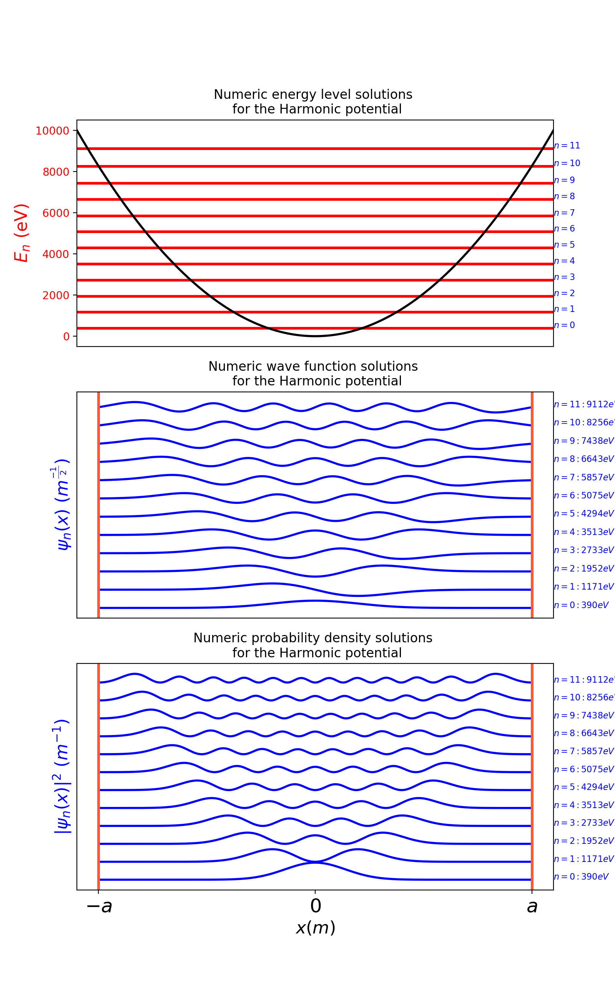

<IPython.core.display.Javascript object>


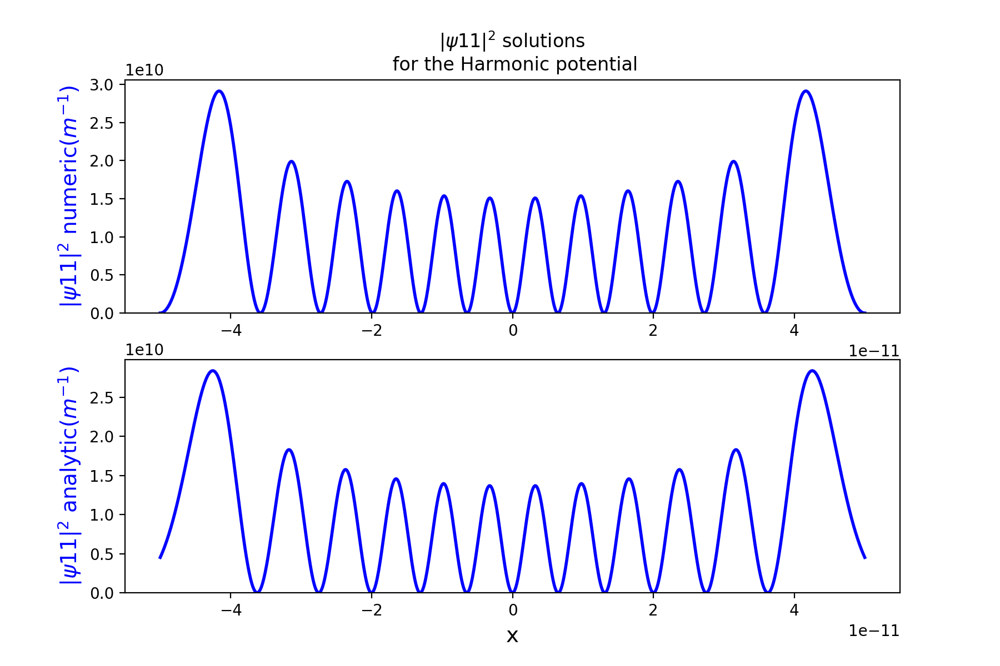

In [28]:
V0 = 10000*e
E_n, psi_n, psi2_n = findzeros(0,10000,100)
fullplot(12,"Harmonic potential",6,0)
compareplot(11,2,"Harmonic potential",0)

<IPython.core.display.Javascript object>


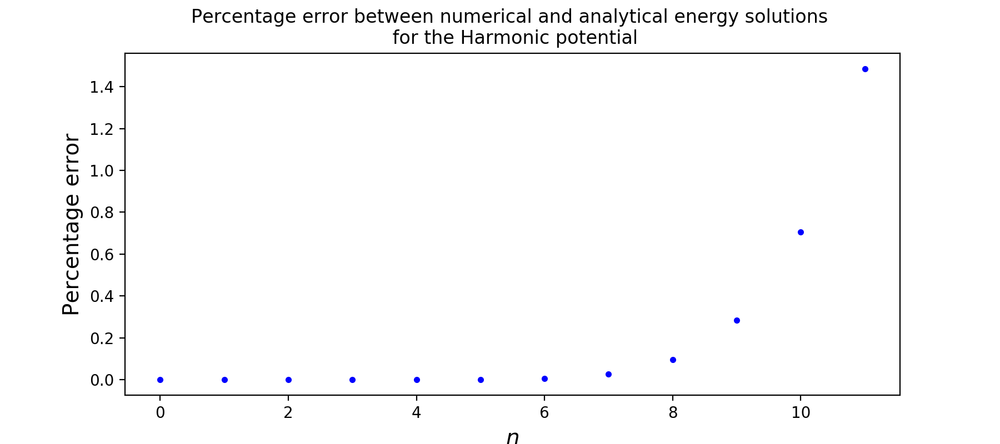

<IPython.core.display.Javascript object>


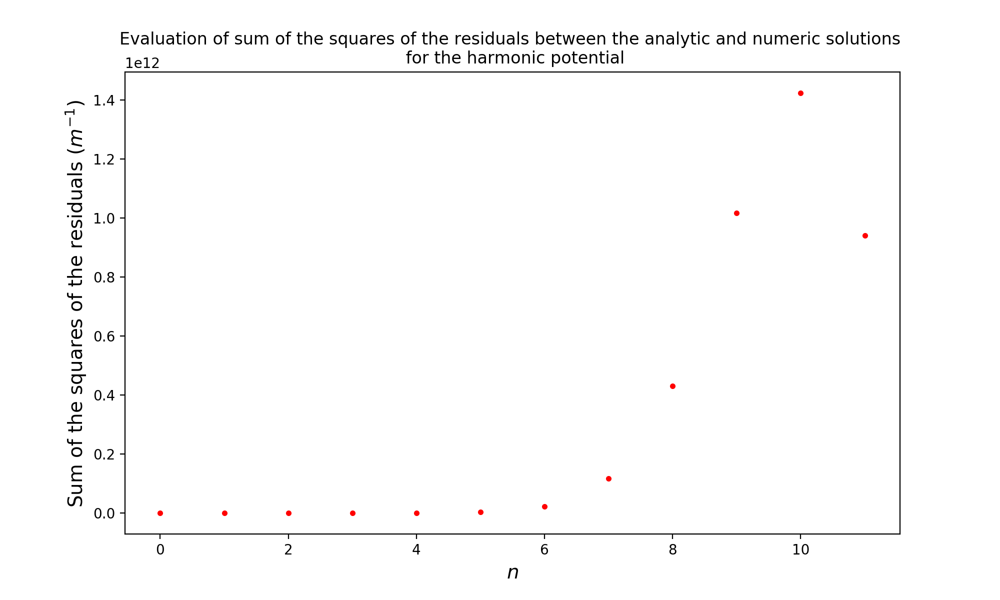

In [29]:
#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {'n':[], 'Found Solutions (eV)':[],'Known Solutions (eV)':[], 'Difference (eV)':[], 'Percentage Error': [] }
df = pd.DataFrame(d)
for i in range(0,len(E_n),1):
    df = df.append({'n': i, 'Found Solutions (eV)': E_n[i]/e, 'Known Solutions (eV)': En(i)/e, 'Difference (eV)': abs(E_n[i] - En(i))/e,'Percentage Error': ((abs(E_n[i] - En(i)))/En(i))*100}, ignore_index=True)
fig, ax = plt.subplots(1, 1, figsize=(9, 4))
ax.set_title(f"Percentage error between numerical and analytical energy solutions \n for the Harmonic potential")
ax.set_xlabel("$n$", fontsize=14)
ax.set_ylabel("Percentage error", fontsize=14)
ax.plot(df['n'],df['Percentage Error'], c='b', linestyle = 'none', marker = '.');

#Creates a pandas data frame so comparing analytical to numerical results is easier
d = {}
df = pd.DataFrame(d)
for i in range(0,len(E_n),1):
    df = df.append({'n': i, 'Sum of the squares': np.sum(abs(analytic(xplotpoints,i)) - abs(psi_n[i]))**2}, ignore_index=True)
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.plot(df['n'],df['Sum of the squares'],c='r', linestyle = 'none', marker = '.')
ax.set_ylabel(r"Sum of the squares of the residuals $(m^{-1})$ ", fontsize=14)
ax.set_xlabel("$n$", fontsize=14)
ax.set_title('Evaluation of sum of the squares of the residuals between the analytic and numeric solutions \n for the harmonic potential');
#df.head(5) #Show the data frame, df.head(n)-will show the first n solutions

## 6. Discussion of results for $V_0 = 10000eV$

It can be seen that for higher values of $V_0$ the analytical and numerical solutions are a closer match especially in the case of the energy eigenvalues. This is because the walls of the harmonic potential lie within the infinite square well for longer and hence the embedded potential becomes a much closer approximation to the pure harmonic potential.

Classically it would be be predicted that the probability of finding the particle would be distributed evenly along the base of the potential as shown in the image below [8]. This quantum model approaches this as $n$ increases and the number of peaks in the probability density plot increases (such as in the plot for $n = 11$). This is another example of the correspondence principle.

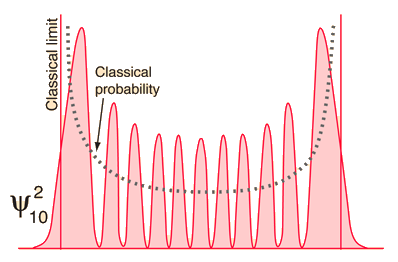

In [30]:
from IPython.display import Image 
Image(filename='hoscor10.gif', embed=True) 

---

# Part d) Finite square well potential

In this next section we will explore the finite square well potential embedded within the infinite square well. For this scenario the results will only be compared qualitatively with the known solutions as these require numerical methods to solve.

## 1. The potential

Now we will use a potential of the form:

$$
V_x = \begin{cases} 0 & \text{if } -width \leq x \leq +width, \\ 
    V_0  & \text{if } |x| > width, \end{cases} 
$$


In [31]:
def V(x):
    """The finite square well potential
       Input: x: x position value or array of x position values 
       Output: Either The finite square well potential evalauted for the x input value
       or the finite square well potential value over a range of points"""
    #This condition is the potential used for the Runge-Kutta
    if type(x) != np.ndarray:
        if abs(x) <= width:
            return 0
        else:
            return V0
    
    #This condition here deals with plotting the potential, I was unable to plot the potential with out including this condition 
    else:
        V = np.array([])
        for i in x:
            if abs(i) <= width:
                V = np.append(V,0)
            else:
                V = np.append(V,V0)
        return V

## 2. Numerical solutions  for $V_0 = 600eV$  and a width of $a/2$

We can now attempt to find the first few numerical solutions for this potential:

<IPython.core.display.Javascript object>


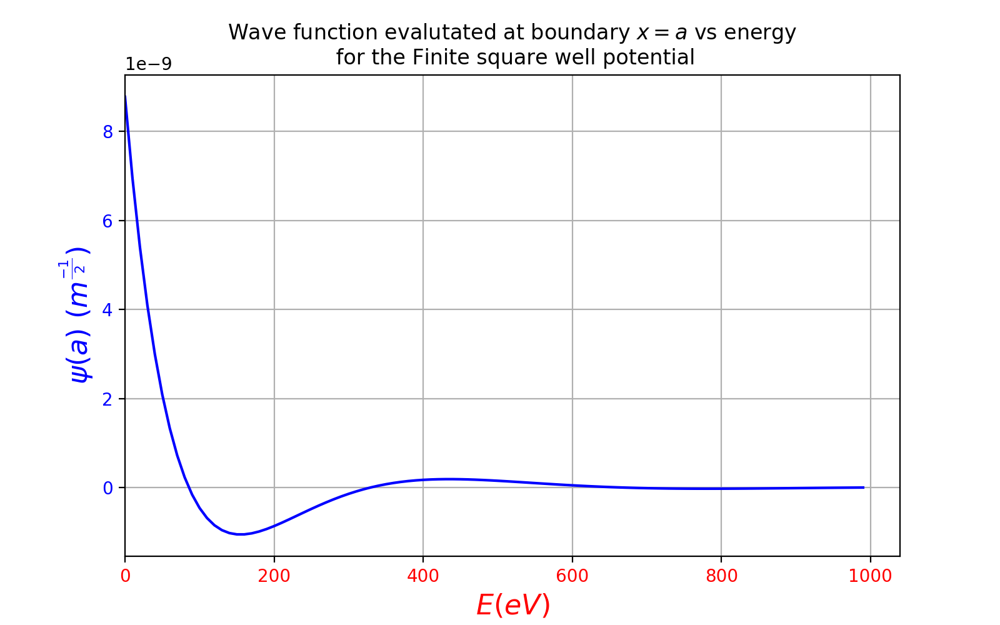

In [32]:
V0 = 600*e
width = a/2
boundaryplot("Finite square well potential")

The first solution looks to be around  83𝑒𝑉  and the second around  323𝑒𝑉 . Using the solution finding function we can look for the first few solutions in the range of  0−3000𝑒𝑉  with a step size of  80𝑒𝑉:

 8 solutions found


<IPython.core.display.Javascript object>


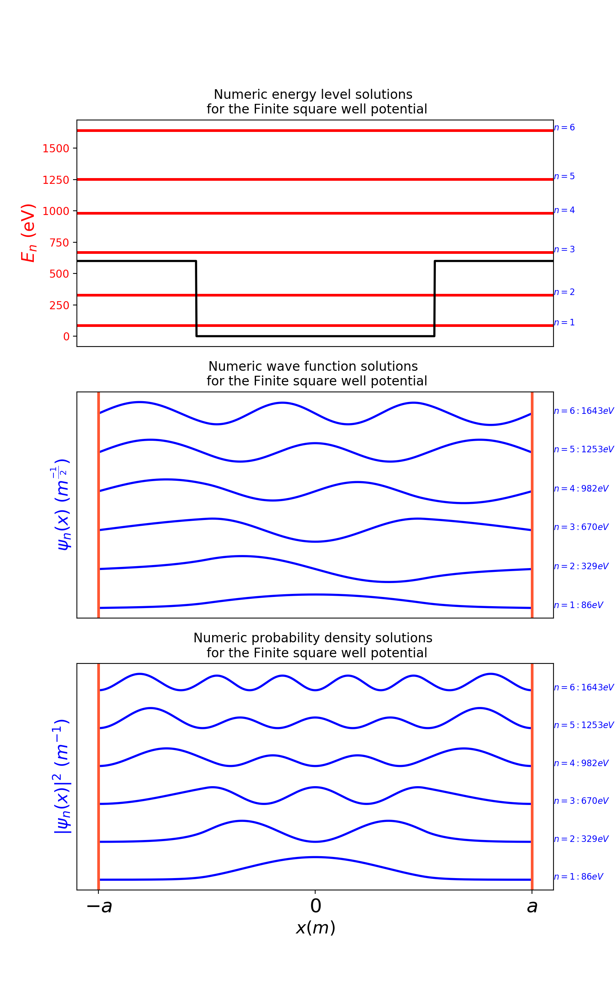

<IPython.core.display.Javascript object>


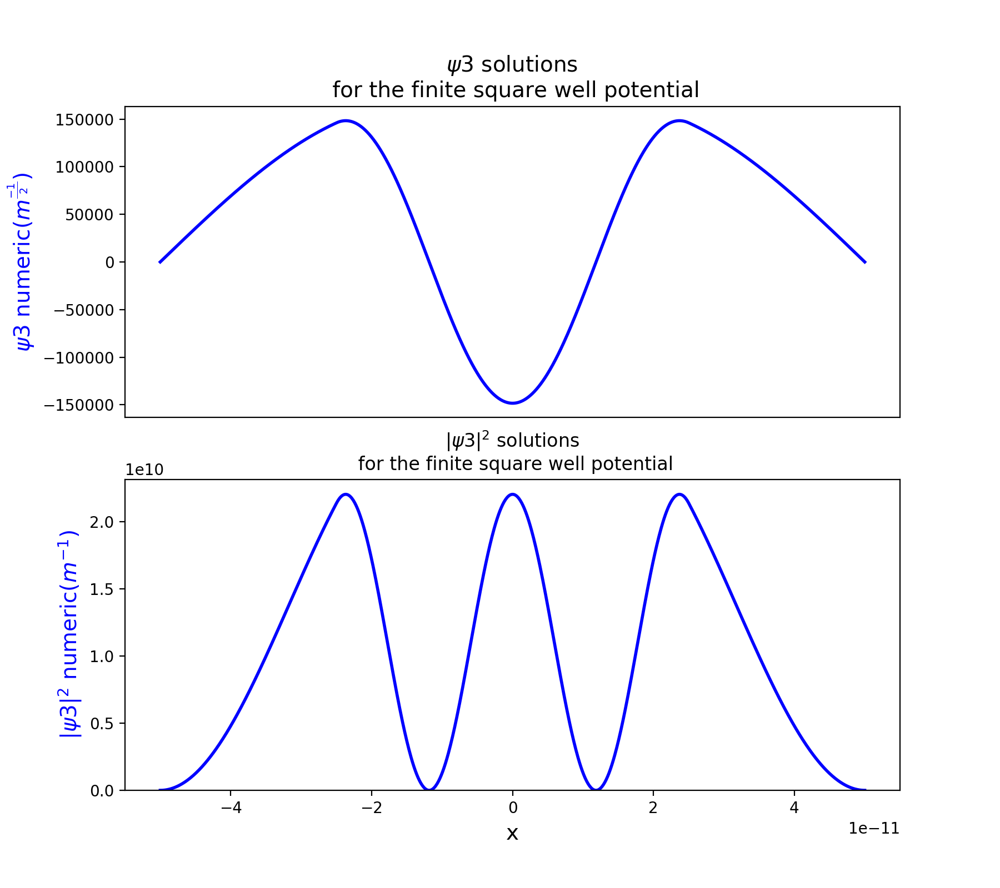

<IPython.core.display.Javascript object>


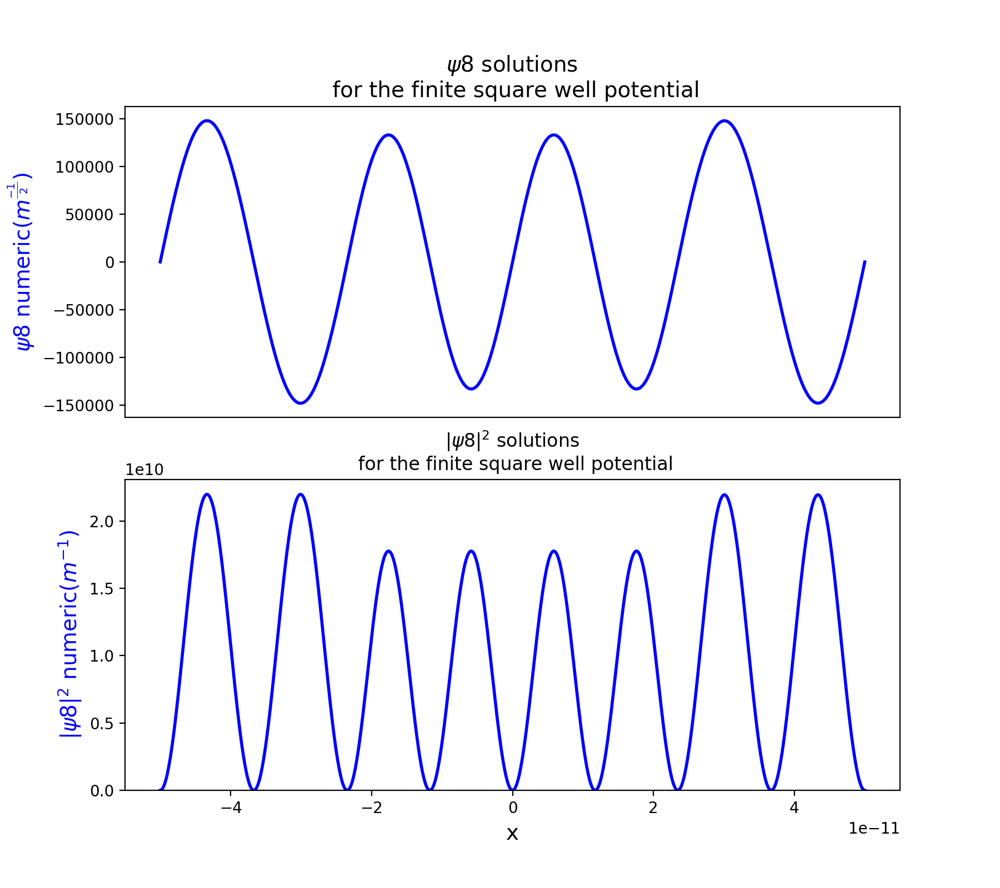

In [33]:
E_n, psi_n, psi2_n  = findzeros(0,3000,80)
print(f" {len(E_n)} solutions found")
fullplot(6, "Finite square well potential",5,1)
solplot(3,"finite square well potential")
solplot(8,"finite square well potential")

## 3. Changing the width and height of the well

###  Higher walls : $V_0 = 10000 eV$, Width = $\frac{a}{2}$

 11 solutions found


<IPython.core.display.Javascript object>


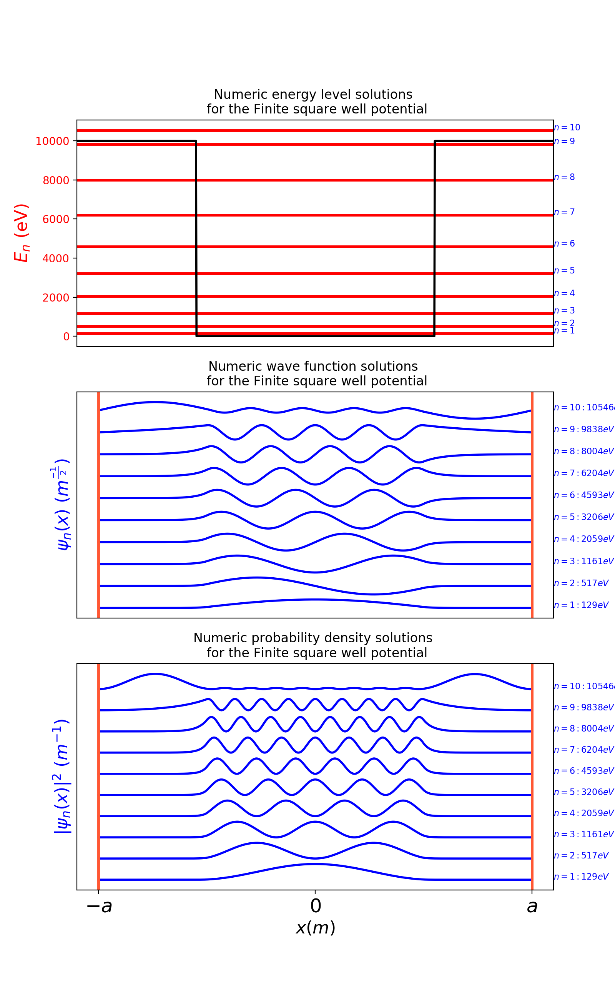

In [34]:
width = a/2
V0 = 10000*e
E_n, psi_n, psi2_n  = findzeros(0,11000,100)
print(f" {len(E_n)} solutions found")
fullplot(10, "Finite square well potential",5,1)

### Smaller well: $V_0 = 10000 eV$, Width = $\frac{a}{10}$

<IPython.core.display.Javascript object>


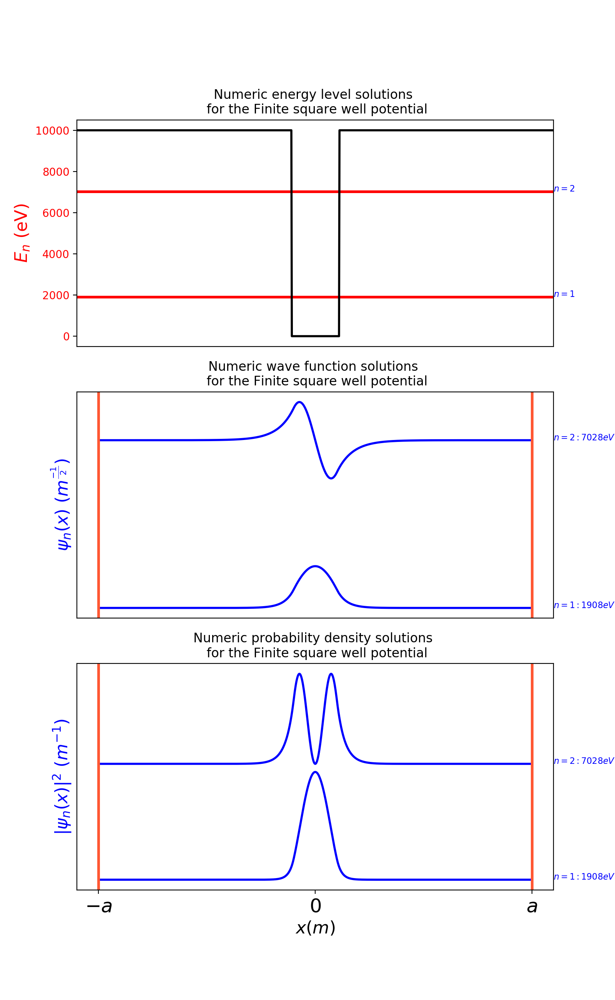

In [35]:
width = a/10
E_n, psi_n, psi2_n  = findzeros(0,10000,100)
fullplot(2, "Finite square well potential",15,1)

## 4. Discussion of results

Once again the numerical wave functions can be seen to take on a similar form to the analytical solutions (The first three are shown below [9]). The differences, once again, come down to the presence of the infinite walls. While both solutions display quantum tunneling, the numerical solutions decay to zero at the boundary of the infinite square well whereas the analytic solutions do not as they aren't constrained by the infinite potential. The larger the value of $V_0$, the smaller the probability density outside of the finite well and hence both solutions are closer in shape. 

The numerical wave functions become more localised to the finite well as its width is made smaller. It would be expected that the shape of these solutions would become closer in form to the pure finite solutions as the effects of quantum tunneling would be reduced. The larger the width of the finite well the closer the numerical solutions get to the solutions for the infinite square well compared to the pure solutions. 

Once the energy eigenvalue of a solution is greater than $V_0$ the particle has escaped the potential well. In the numerical solutions the particle is still constrained by the infinite walls whereas, in the purely finite case the particle would now be free of the potential. This is where the largest differences between the embedded potential and the pure potential would be expected.

Looking at how the numerical results change for different eigenvalues and well shapes, it can be seen that a narrower well produces fewer eigenvalue solutions within the well and highly localised wave functions. Raising and narrowing the walls of the well also increase the magnitude of each energy eigenvalue as if they were raising the base level of the infinite well.

For solutions with energies greater than the walls of the well, the probability density is larger in the regions either side of the well and as $n$ increases, this starts to form an even distribution once again in agreement with the correspondence principle.

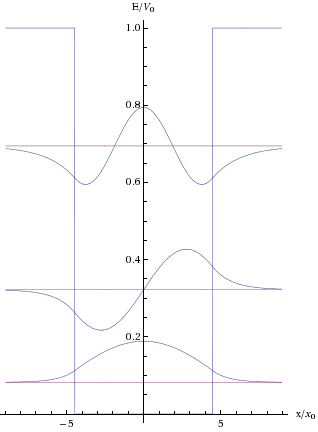

In [36]:
Image(filename='Finite-well-solutions.gif', embed=True) 

---

# Part e) The potential barrier

In this section we will explore the finite potential barrier which is the inverse of the finite well. We will also find that because this barrier is embedded within the infinite square well the solutions we obtain look like those of the double well potential. 

## 1. The potential 

$$
V_x = \begin{cases} V_0 & \text{if } -width/2 \leq x \leq +width/2, \\ 
    0 & \text{if } |x| > a/2, \end{cases} 
$$

In [37]:
def V(x):
    """The potential block
       Input: x: x position value or array of x position values 
       Output: Either The potential block evalauted for the x input value
       or the potential block value over a range of points"""
    #This condition is the potential used for the Runge-Kutta
    if type(x) != np.ndarray:
        if abs(x) <= width:
            return V0
        else:
            return 0
    
    #This condition here deals with plotting the potential
    else:
        V = np.array([])
        for i in x:
            if abs(i) <= width:
                V = np.append(V,V0)
            else:
                V = np.append(V,0)
        return V

## 2. Numerical solutions for varying  $V_0 $ and width 

### $V_0 = 200eV$, width = $a/10$ 

 5 solutions found


<IPython.core.display.Javascript object>


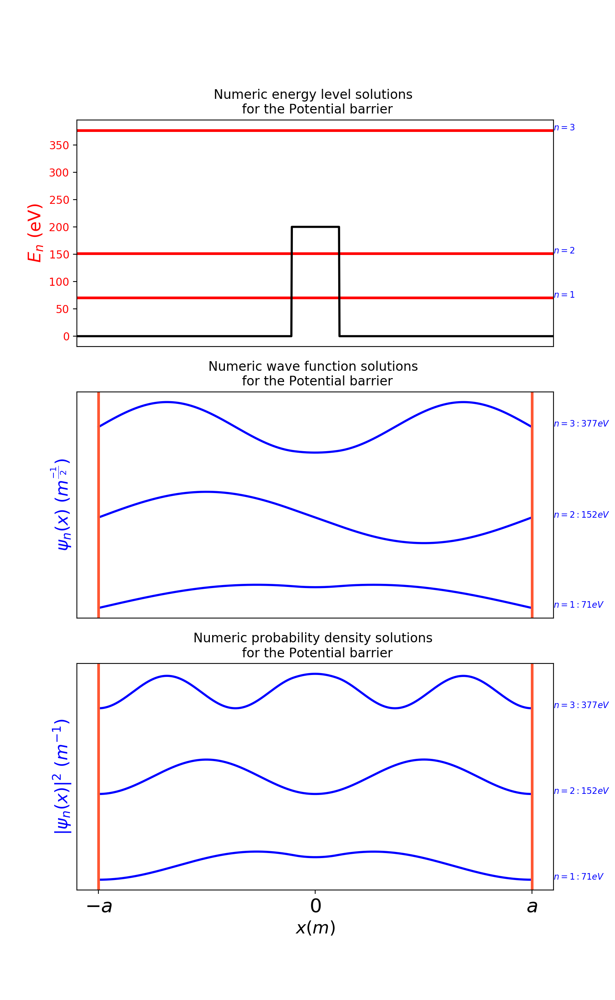

In [38]:
V0 = 200*e
width = a/10
E_n, psi_n, psi2_n  = findzeros(0,1000,10)
print(f" {len(E_n)} solutions found")
fullplot(3, "Potential barrier",5,1)

###  Thinner block: $V_0 = 500eV$, width = $a/1000$

<IPython.core.display.Javascript object>


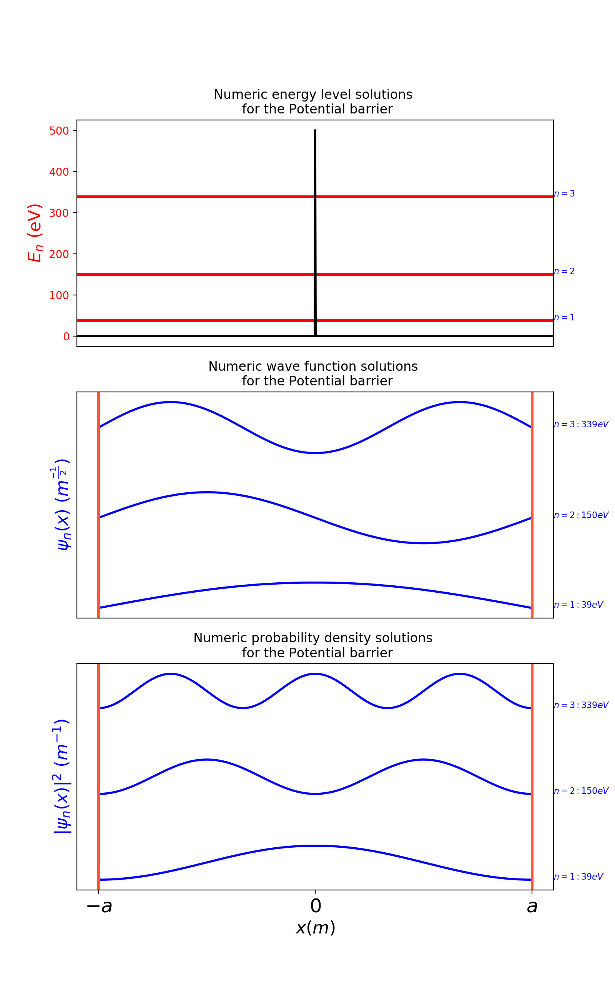

In [39]:
V0 = 500*e
width = a/1000
E_n, psi_n, psi2_n  = findzeros(0,1000,10)
fullplot(3, "Potential barrier",5,1)

###  Thicker and higher block: $V_0 = 500eV$, width = $a/5$

<IPython.core.display.Javascript object>


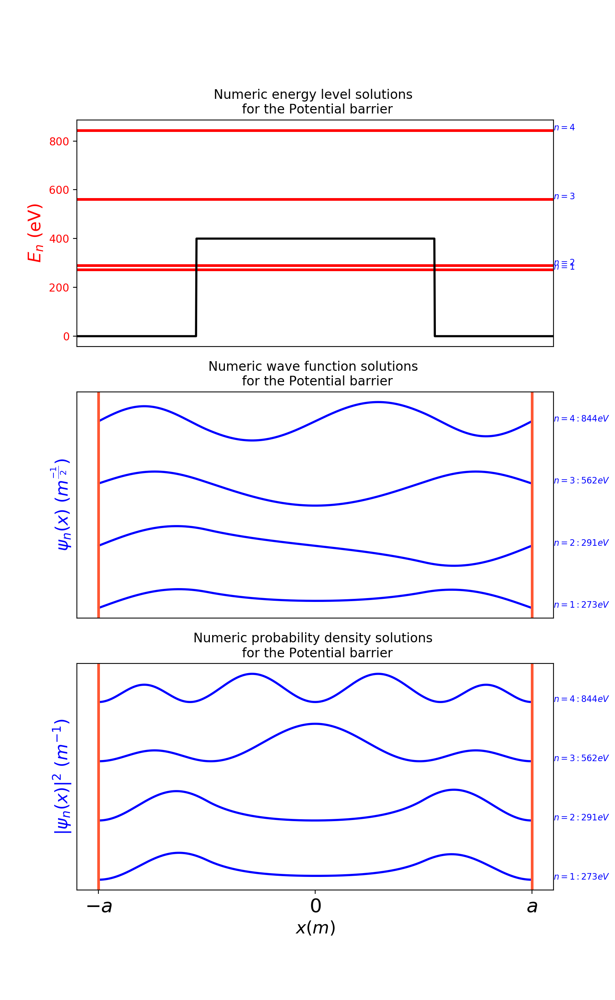

In [40]:
V0 = 400*e
width = a/2
E_n, psi_n, psi2_n  = findzeros(0,1000,10)
fullplot(4, "Potential barrier",5,1)

## 3. Discussion of results

Here we can once again see quantum tunneling. When the wave functions with energies lower than $V_0$ reach the block they begin to decay until they reach the other side and reform again. Initially I was attempting to compare my solutions to those produced by the potential barrier a shown below [10]. However these solutions come about by instead considering an incoming beam of particles with a given flux. These at first take the form of a free wave which then strikes the barrier. In this case a particle would be hitting the barrier and then tunneling through. 

The wave functions in our case look like the predicted result for the double well potential as discussed in [11] (In the article each well has a shape closer to that of the harmonic oscillator or Morse potential however the same effects are noticeable), and shown by [12] below. This is a potential commonly seen in problems involving atomic and molecular bonding. The reason the found solutions look closer to the double potential than the potential barrier is because the barrier is embedded within the infinite square well - effectively making it into a double well.

We can see that as the width of the block decreases, the closer the wave functions get to those of the infinite square well. Classically the width of this barrier shouldn't matter and the particle shouldn't be able to pass through. The wave function can also be observed to tunnel through the barrier in which it decays before reforming on the other side. The energy eigenvalue for a given $n$ is seen to increase as the barrier is made higher and wider.

For the values of $n$ where the energies are less than that of $V_0$ we can see that different energy values produce very similar probability density plots and wave functions with opposite parity. This is another result common of the double potential [17].

The first image below is the potential barrier, the second is the double well:

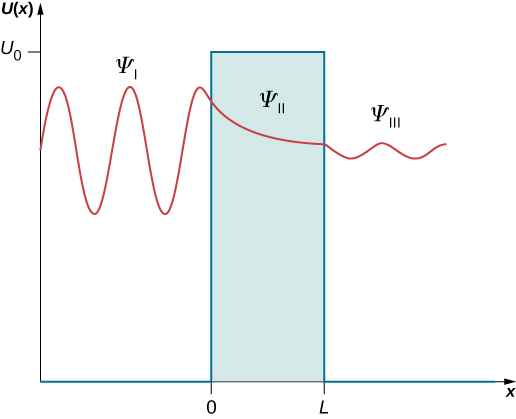

In [41]:
Image(filename='barrier.jpeg', embed=True) 

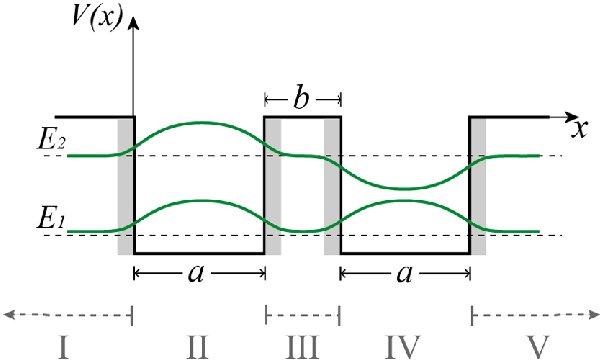

In [42]:
Image(filename='double well.png', embed=True)

Below is another quick example of a double well taken from [15] (It has been commented out to save space - remove commenting to show). It can be seen that the first two solutions take on a form very similar to the embedded potential block:

In [43]:

#def V(x):
    #"""The Double well potential
    #Input: x: x position value
    #Output: The double well potential evalauted for the x input value"""
    ##The paramters have been chosen simply to create a double well shape 
    #return 1000*e*(0.95*((x/a)**4) - ((x/a)**2)) + 300*e #300eV added on the end so the potential is positve 

#E_n, psi_n, psi2_n = findzeros(0,300,10)
#fullplot(2, "Square wave potential",5,1)


---

# Part f) Periodic potential - square wave

In this section I will combine multiple potential blocks together to create a potential similar to the periodic potential used in the Kronig-Penny model.

## 1. The potential

$$ V(x) = \begin{cases} V_0 & \text{if } \lfloor \frac{xf}{a} \rfloor\  \text{is even}, \\ 
0  & \text{if } \lfloor \frac{xf}{a} \rfloor\  \text{is odd}, \end{cases} 
$$

In [44]:
V0 = 100*e
freq = 5
def V(x):
    """The potential block
       Input: x: x position value or array of x position values 
       Output: Either The potential block evalauted for the x input value
       or the potential block value over a range of points"""
    #This condition is the potential used for the Runge-Kutta
    if type(x) != np.ndarray:
        if np.floor((x*freq)/(a)) % 2 == 0:
            return V0
        else:
            return 0
    
    #This condition here deals with plotting the potential
    else:
        V = np.array([])
        for i in x:
            if np.floor((i*freq)/(a)) % 2 == 0:
                V = np.append(V,V0)
            else:
                V = np.append(V,0)
        return V

## 2. Numerical solutions for varying frequency and block height

In this section I have experimented with changing the height of each potential block and their frequency. For some case I have plotted the first wave function so the general effects on the ground state can be commented on while for others I have shown the first few solutions.

### $V_0 = 100eV$, $f=5$

 5 solutions found


<IPython.core.display.Javascript object>


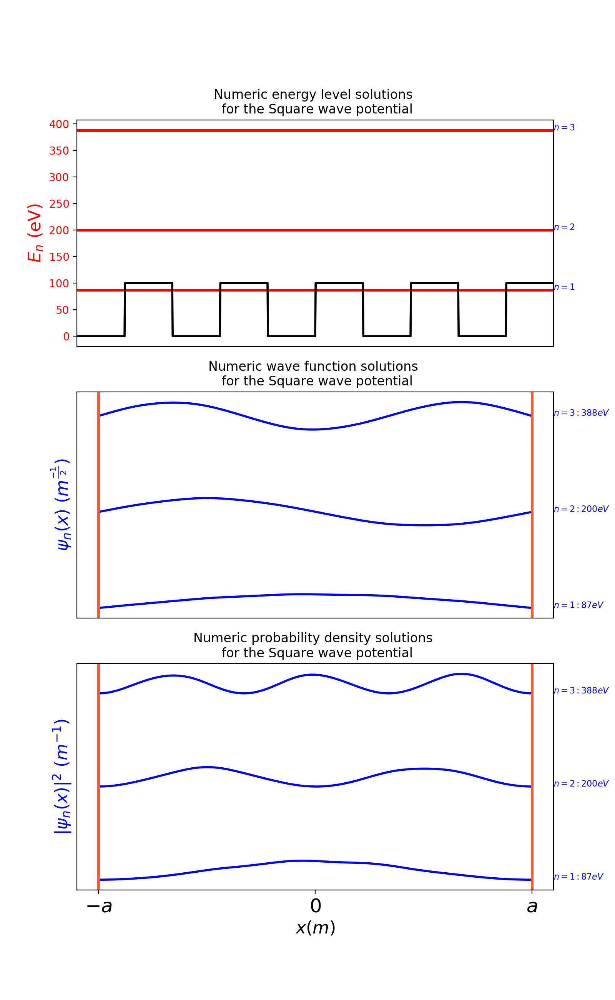

In [45]:
E_n, psi_n, psi2_n = findzeros(0,1000,10)
print(f" {len(E_n)} solutions found")
fullplot(3, "Square wave potential",10,1)

### $V_0 = 1000eV$, $f=5$

<IPython.core.display.Javascript object>


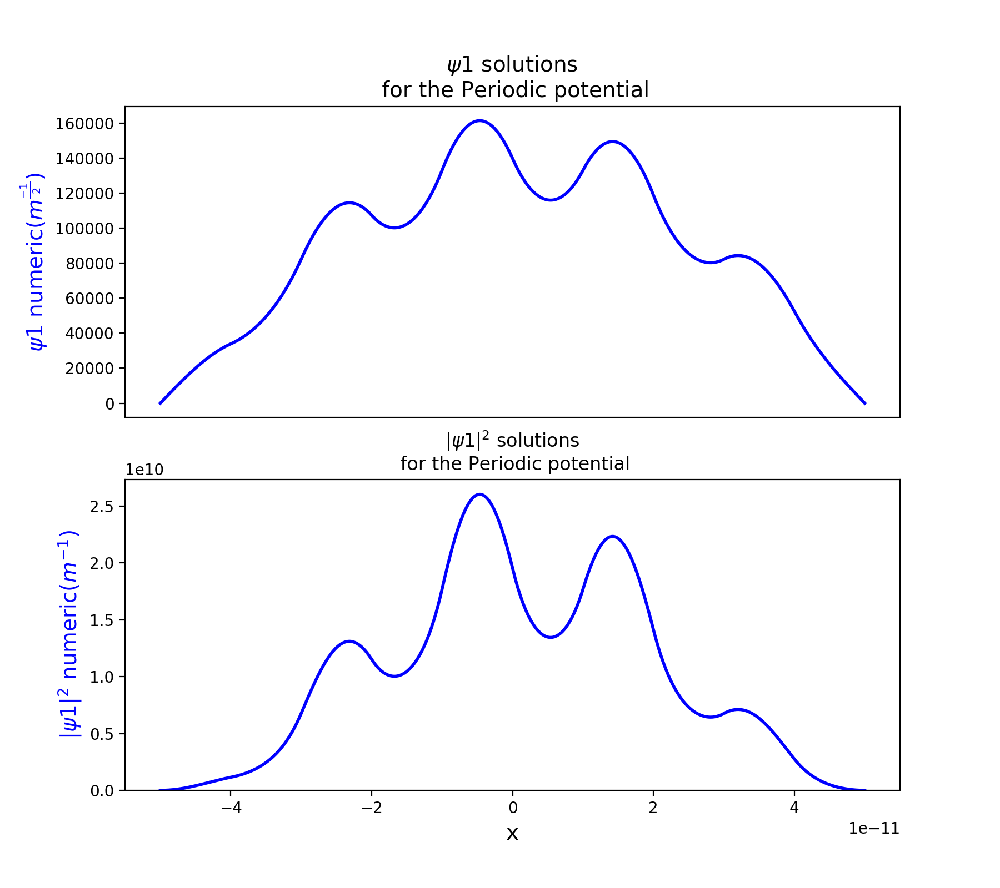

In [46]:
V0 = 1000*e
freq = 5
E_n, psi_n, psi2_n = findzeros(0,1000,10)
solplot(1,"Periodic potential")

### $V_0 = 1000eV$, $f=20$

<IPython.core.display.Javascript object>


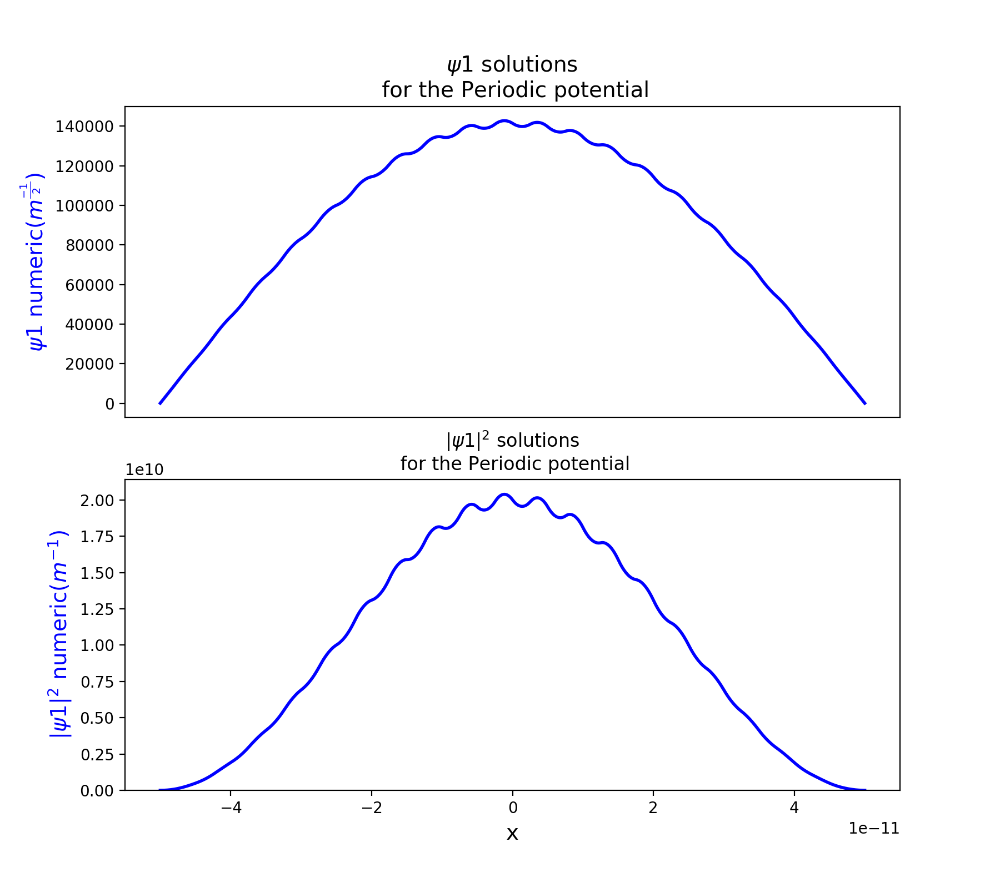

In [47]:
V0 = 1000*e
freq = 20
E_n, psi_n, psi2_n = findzeros(0,1000,10)
solplot(1,"Periodic potential")

### $V_0 = 1000eV$, $f=3$

<IPython.core.display.Javascript object>


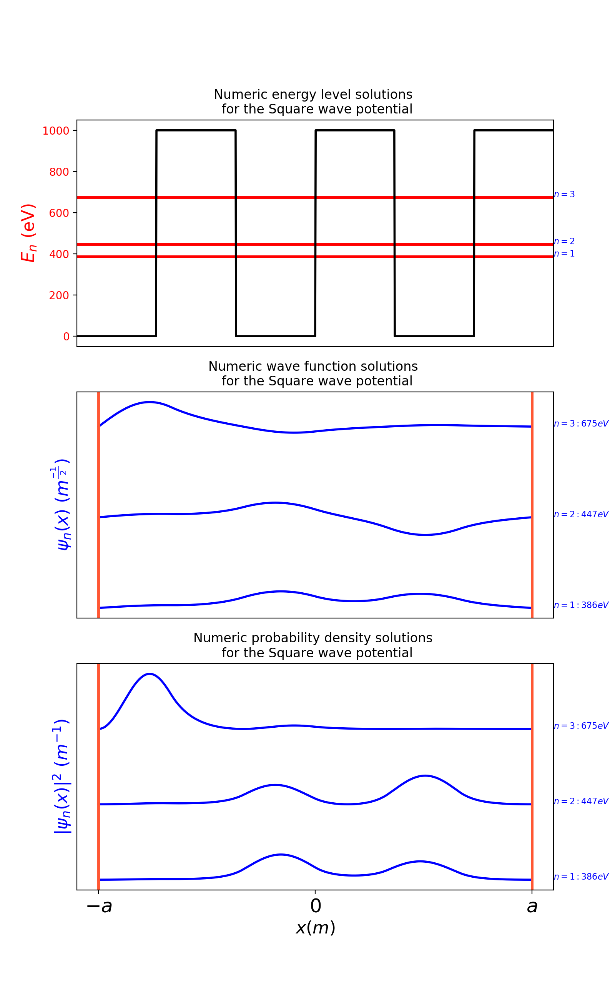

In [48]:
V0 = 1000*e
freq = 3
E_n, psi_n, psi2_n = findzeros(0,1000,10)
fullplot(3, "Square wave potential",10,1)

## 3. Discussion of results

Adding a periodic potential appears to distort the wave function. The larger the amplitude and lower the frequency the greater these distortions are. These distortions allow the overall shape found in the infinite square well to be seen as well as periodic spikes in amplitude over each 'box' produced by the periodic potential. This could be considered to be like the particle in the box being distributed over multiple lattice sites. In the case where $f = 5$, once the energy eigenvalue of a wave function is greater than the height of the blocks it produces a solution which looks like that purely of the infinite square well. The particle is now free of the potential but still constrained by the infinite walls.

Increasing the height of the blocks increases to energy of each state. If the frequency is continued to be increased the solutions eventually look exactly like those of the infinite square well.

In the final figure displayed above $n=1$ and $n=2$ show similar results with the particle almost equally likely to be found in box 2 or box 3 with $n=1$ giving slightly more preference to box 2 and $n=2$ to box 3. In the case of $n=3$ the particle is now more likely to be found in box 1. 

In the case of the pure periodic potential, bands and band gaps can be seen to arise in the energy solutions.

# Part g) The Morse potential

This is the final potential shape I will try before concluding this notebook. The Morse potential is typically used to model the oscillating nature of an atomic bond as it varies from that of the harmonic oscillator due to an-harmonic effects.

## 1. The Morse potential

The Morse potential is given by [13]:

$$ V(x)= D(1-e^{-\beta(x-x_0)})^2 $$

Where $D$ is the dissociation energy (This changes the depth of the well), $x_0$ is the point at which the potential is centered, and $\beta = \sqrt{\frac{k}{2D}}$, where $k$ is the harmonic force constant:

In [49]:
def V(x):
    """The Morse potential 
    Input: x: x position value
    Output: The Morse potential evalauted for the x input value"""
    return D*(1-np.exp(-beta*(x-x0)))**2

## 2. Numerical solutions

<IPython.core.display.Javascript object>


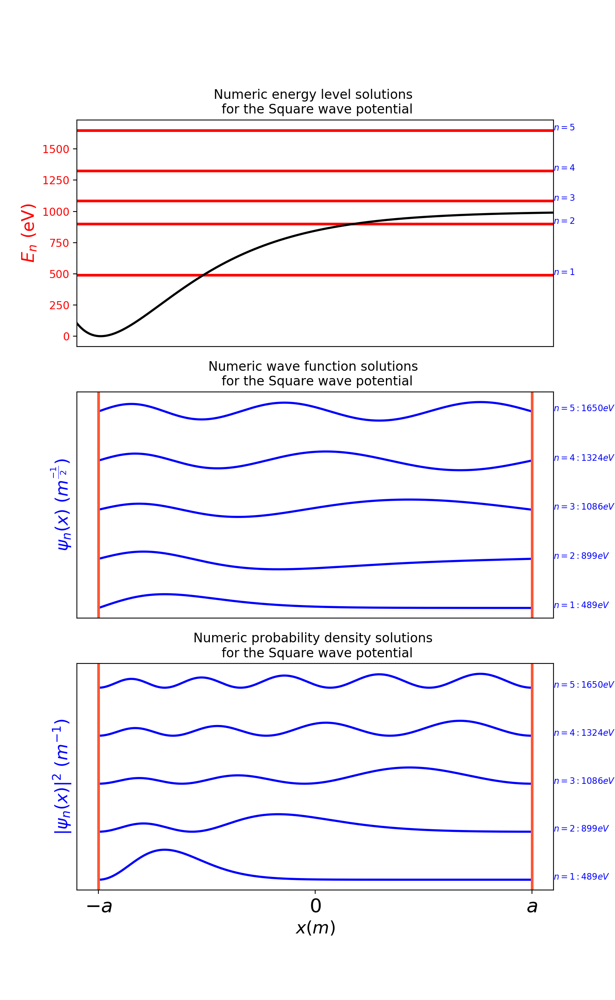

In [50]:
D = 1000*e
k = 1e6
beta = np.sqrt(k/(2*D))
x0 = -a+0.1*a
E_n, psi_n, psi2_n = findzeros(0,2000,10)
fullplot(5, "Square wave potential",8,1)

## 3. Discussion of results

I experimented with values of $D$ and $k$ until an interesting shaped potential was formed. The wave functions can be seen to spread into the space created as the potential widens.  Increasing the value of $D$ changed the number of solutions which would fall within the Morse potential. Changing $k$ affected how quickly the potential approached $D$, increasing this would cause the wave functions to approach the shape of those produced by the purely infinite square well. 

Changing $D$ and $k$ can give the potential a form closer to that of the harmonic potential. The wave functions approach those of the purely infinite square well as the energy becomes greater than $D$. Increasing the depth of the potential raised values of the corresponding energy levels.

After the Morse potential I experimented with the soft core Coulomb potential [13] where $r = (x - x_0)$, and $b$ is a softening factor (removes the discontinuity when $x = x_0$):

$$ V(x)= -\frac{1}{4\pi \epsilon_0}\frac{e^2}{\sqrt{r^2+b^2}} $$

However this didn't produce any uniquely interesting results. When the softening factor was high the potential took on a shape similar to the harmonic potential and when the softening factor was low the potential acted similarly to the thin and high potential block example. I also had issues finding eigenvalue solutions which lay within the potential.

# Conclusion

Before ending the notebook I thought it would be useful to discuss overarching patterns present between each potential:

The number of peaks in the plot of $|\psi(x)|^2$ is proportional to the value of $n$ for each solution. Therefore, as $n$ increases, the distribution of all the wave function becomes more even and thus approaches predictions made by classical physics. 

The number of peaks of  $|\psi(x)|^2$ is also related to the number of embedded divisions present within the infinite square well and their width in proportion to it. Increasing these divisions or making their widths smaller yields results closer to those of the purely infinite square well.

Increasing the height of any perturbation present within the infinite well increase the values of the allowed energy solutions. This in fact is expected by perturbation theory in which energy corrections can be added to the Hamiltonian in order to solve for wave functions in the presence of small, embedded, disturbances. 

For potentials with analytical solutions, closer agreement was found between the numerical and analytical results when the potential became closer in shape to that of the infinite square well.

I found an article discussing solutions to the Schrodinger equation using the finite difference method [18]. This contained really quick solutions for a given potentials using the matrix formalization of quantum mechanics. I was tempted to use this method however as I started out using the secant and Runge-Kutta methods and haven't yet covered QM using matrices I thought it would be best to stick to this method of root finding. However, It would be interesting to use the method mentioned in the article and see what differences appear when compared to the change of sign/secant and Runge-Kutta method.

Thank you for taking the time to read my assignment.

## Bibliography

[1] -  Dash, L. 2020. _" PHAS0029 Final Assignment 2020"_. \[Online\] UCL Moodle resource. Available from   https://moodle.ucl.ac.uk/course/view.php?id=6766&section=14 \[accessed 8th March 2021\]


[2]-  Dash, L. 2020. _"PHAS0029-Session06-EulerRungeKutta - Numerical solutions to differential equations: The Euler and Runge Kutta methods."_. \[Online\] UCL Moodle resource. Available from   https://moodle.ucl.ac.uk/course/view.php?id=6766&section=14 \[accessed 8th March 2021\] 


[3]-  Rae, Alastair I. M., Napolitano, Jim, 2016. _"Quantum mechanics"_. Sixth edition. CRC Press


[4]-  Dash, L. 2020. _"PHAS0029 Session 8 - Finding roots, and boundary value problems"_. \[Online\] UCL Moodle resource. Available from   https://moodle.ucl.ac.uk/course/view.php?id=6766&section=14 \[accessed 8th March 2020\]

[5] - Riley, K. F., Hobson, M. P., Bence, S. J."*Mathematical Methods for Physics and Engineering*". Third edition. Cambridge

[6] - "*Quantum Harmonic Oscillator: Wavefunctions*". [Online\] Available from http://hyperphysics.phy-astr.gsu.edu/hbase/quantum/hosc5.html \[accessed 20th March 2021\]

[7] - Function documentation. [Online\] Available from https://scipy.github.io/devdocs/generated/scipy.special.eval_hermite.html

[8] - Image [Online\] Available from http://hyperphysics.phy-astr.gsu.edu/hbase/quantum/hosc6.html \[accessed 21st March 2021\]

[9] - Image [Online\] Available from https://en.wikipedia.org/wiki/Finite_potential_well \[accessed 21st March 2021\]

[10] - Image [Online\] Available from https://opentextbc.ca/universityphysicsv3openstax/chapter/the-quantum-tunneling-of-particles-through-potential-barriers/ \[accessed 21st March 2021\]

[11] - F. Marsiglio, V. Jelic, "*The double-well potential in quantum mechanics: A simple, numerically exact formulation*" [Online\] https://www.researchgate.net/publication/230839730_The_double-well_potential_in_quantum_mechanics_A_simple_numerically_exact_formulation \[accessed 21st March 2021\]

[12] - Image [Online\] Available from https://www.researchgate.net/figure/A-plot-of-the-double-finite-square-well-potential-The-regions-were-indicated-by-Cam-and_fig5_344417666 \[accessed 21st March 2021\]

[13] - "*The Harmonic Oscillator Approximates Vibrations*" [Online\] Available from https://chem.libretexts.org/Bookshelves/Physical_and_Theoretical_Chemistry_Textbook_Maps/Map%3A_Physical_Chemistry_(McQuarrie_and_Simon)/05%3A_The_Harmonic_Oscillator_and_the_Rigid_Rotor/5.03%3A_The_Harmonic_Oscillator_Approximates_Vibrations \[accessed 25th March 2021\]

[14] - Manuel Iñarrea, Víctor Lanchares, Jesús F. Palacián, Ana I. Pascual, J. Pablo Salas, Patricia Yanguas,
"*Effects of a soft-core coulomb potential on the dynamics of a hydrogen atom near a metal surface*",
Communications in Nonlinear Science and Numerical Simulation, Volume 68, 2019,[Online\] Available from https://www.sciencedirect.com/science/article/pii/S1007570418302594 \[accessed 25th March 2021\]

[15] - "*DOUBLE-WELL POTENTIAL: SYMMETRY AND TUNNELLING*" [Online\] Available from http://www2.chem.umd.edu/groups/alexander/chem691/double_well.pdf \[accessed 25th March 2021\]

[16] - [Online\] Available from http://www.sos.siena.edu/~jcummings/teaching/quantum/Tipler-6.2.pdf \[accessed 25th March 2021\]

[17] - Foot, C. J.  and  Shotter, M. D.,  "*Double well potentials and quantum gates*", [Online\] Available from https://arxiv.org/pdf/0902.4271.pdf \[accessed 25th March 2021\]

[18] - Obi Tayo, Benjamin,"*Finite Difference Solution of the Schrodinger Equation*" [Online\] Available from https://medium.com/modern-physics/finite-difference-solution-of-the-schrodinger-equation-c49039d161a8 \[accessed 28th March 2021\]